In [258]:
import pandas as pd
import numpy as np 
import seaborn as sns
import statsmodels.api as sm
import pandas.tseries
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import itertools
from matplotlib.pylab import rcParams
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf

df = pd.read_csv('zillow_data.csv')

In [3]:
def get_datetimes(df):
    return pd.to_datetime(df.columns.values[7:], format='%Y-%m')

In [4]:
def get_datetimes(df):
    return pd.to_datetime(df.columns.values[7:], format='%Y-%m')

In [5]:
def melt_data(df):
    melted = pd.melt(df, id_vars=['RegionID','RegionName', 'City', 'State', 'Metro', 'CountyName','SizeRank'], var_name='time')
    melted['time'] = pd.to_datetime(melted['time'], infer_datetime_format=True)
    melted = melted.dropna(subset=['value'])
    return melted.groupby('time').aggregate({'value':['mean','std']})

In [6]:
pd.options.display.max_columns = 10

In [7]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14723 entries, 0 to 14722
Data columns (total 272 columns):
 #   Column      Dtype  
---  ------      -----  
 0   RegionID    int64  
 1   RegionName  int64  
 2   City        object 
 3   State       object 
 4   Metro       object 
 5   CountyName  object 
 6   SizeRank    int64  
 7   1996-04     float64
 8   1996-05     float64
 9   1996-06     float64
 10  1996-07     float64
 11  1996-08     float64
 12  1996-09     float64
 13  1996-10     float64
 14  1996-11     float64
 15  1996-12     float64
 16  1997-01     float64
 17  1997-02     float64
 18  1997-03     float64
 19  1997-04     float64
 20  1997-05     float64
 21  1997-06     float64
 22  1997-07     float64
 23  1997-08     float64
 24  1997-09     float64
 25  1997-10     float64
 26  1997-11     float64
 27  1997-12     float64
 28  1998-01     float64
 29  1998-02     float64
 30  1998-03     float64
 31  1998-04     float64
 32  1998-05     float64
 33  1998-06   

In [8]:
#Although there are missing values will evaluate when bringing into smaller groups because can backfill theree
df.isna().sum()

RegionID         0
RegionName       0
City             0
State            0
Metro         1043
              ... 
2017-12          0
2018-01          0
2018-02          0
2018-03          0
2018-04          0
Length: 272, dtype: int64

In [9]:
#columns not in date time so need to find way to graph those and convert to date time
df.head()

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,...,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,...,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,...,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,...,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,...,120300,120300,120500,121000,121500


In [10]:
#Firstly grouping into states to see which states to pull counties for
states = df.drop(columns=['RegionID','RegionName', 'City', 'Metro', 'CountyName','SizeRank'],axis=1).groupby('State').mean()
states = pd.DataFrame(states.reset_index())
state_columns = list(states.T.iloc[0])
states = states.T
states.columns = state_columns
states = states[1:]
states = states.set_index(pd.to_datetime(states.index))
states = states.applymap(lambda x: round(np.float(x),2))

In [11]:
states

,AK,AL,AR,AZ,CA,...,VT,WA,WI,WV,WY
1996-04-01,128382.14,86795.57,68868.04,116202.79,200220.96,...,82825.00,140589.29,115151.38,66461.67,138712.50
1996-05-01,128832.14,87122.15,69015.46,116562.79,200124.83,...,82556.25,140838.99,115099.39,66575.00,138762.50
1996-06-01,129253.57,87460.76,69140.21,116934.88,200035.94,...,82306.25,141101.49,115032.11,66708.33,138741.67
1996-07-01,129639.29,87798.73,69262.89,117315.35,199965.57,...,82037.50,141378.57,114940.67,66848.33,138641.67
1996-08-01,130028.57,88156.96,69378.35,117719.53,199958.75,...,81781.25,141686.01,114840.98,67016.67,138533.33
...,...,...,...,...,...,...,...,...,...,...,...
2017-12-01,322657.14,151629.51,133188.57,265908.26,723263.48,...,216318.75,394339.59,195418.07,124022.22,227525.81
2018-01-01,323775.00,152402.73,133522.86,267327.83,729496.41,...,214750.00,398688.56,196397.89,124104.17,228564.52
2018-02-01,324167.86,153625.68,134456.19,268714.78,735525.98,...,213581.25,402129.91,197306.02,124334.72,229938.71
2018-03-01,323692.86,155504.37,136192.38,270488.70,742146.32,...,213250.00,405867.16,198282.23,124972.22,230996.77


In [12]:
states.index = pd.to_datetime(states.index,format='%Y-%M')
states.index

DatetimeIndex(['1996-04-01', '1996-05-01', '1996-06-01', '1996-07-01',
               '1996-08-01', '1996-09-01', '1996-10-01', '1996-11-01',
               '1996-12-01', '1997-01-01',
               ...
               '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01',
               '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01',
               '2018-03-01', '2018-04-01'],
              dtype='datetime64[ns]', length=265, freq=None)

In [13]:
top10states = list(states.iloc[-1,:].sort_values(ascending=False).head(10).index)
states.iloc[-1,:]

AK    323046.43
AL    157033.88
AR    137620.00
AZ    271952.17
CA    746329.08
CO    410528.92
CT    285431.45
DC    806166.67
DE    271897.56
FL    288191.59
GA    202164.35
HI    683529.03
IA    170143.67
ID    236100.00
IL    211926.51
IN    131251.87
KS    141133.20
KY    155538.85
LA    147392.23
MA    458622.54
MD    329705.36
ME    257631.40
MI    167361.52
MN    227567.73
MO    162589.34
MS    115360.78
MT    238673.24
NC    193125.70
ND    190441.94
NE    176512.05
NH    268830.15
NJ    399037.85
NM    222230.00
NV    329420.39
NY    384160.69
OH    145373.30
OK    117952.04
OR    324085.27
PA    184787.61
RI    308430.51
SC    192832.04
SD    194715.79
TN    151884.16
TX    198029.73
UT    317001.65
VA    285568.83
VT    213150.00
WA    408570.38
WI    199015.36
WV    125476.39
WY    231338.71
Name: 2018-04-01 00:00:00, dtype: float64

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


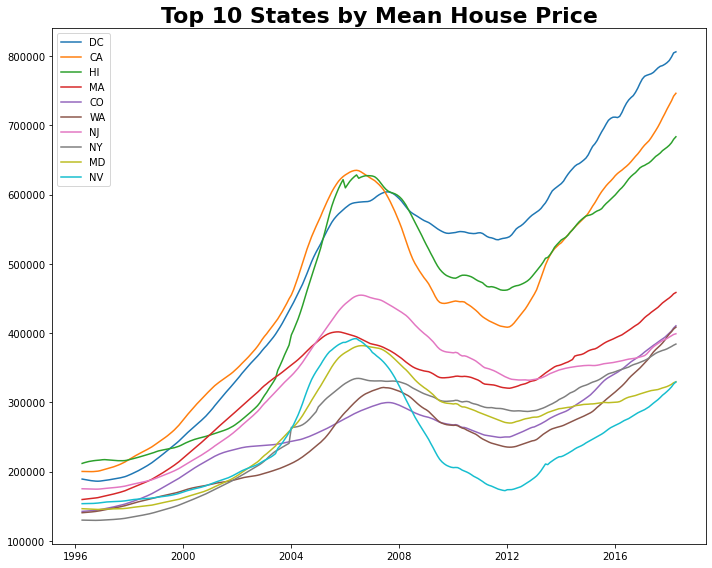

In [14]:
top10states = list(states.iloc[-1,:].sort_values(ascending=False).head(10).index)
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
rcParams['figure.figsize'] = 10,8
sns.lineplot(data=states[top10states],dashes=False)
plt.title('Top 10 States by Mean House Price',font=font)
plt.tight_layout()

Can see that solely on home price basis DC, CA, HI and MA are top states, but this does not consider std or risk free rate

In [15]:
#importing data on US 10 year treasury rates i.e. risk free rate
rfr = pd.read_csv('DGS10.csv')

In [16]:
rfr.DATE = pd.to_datetime(rfr.DATE,infer_datetime_format=True)
rfr = rfr.set_index('DATE')
rfr.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5848 entries, 1996-01-02 to 2018-05-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   DGS10   5848 non-null   object
dtypes: object(1)
memory usage: 91.4+ KB


In [17]:
#cleaing this for string issues and converting to float, also resampling from daily to monthly ts
#and trimming to fit our dataset
rfr = rfr[rfr.DGS10 != '.']
rfr.DGS10 = rfr.DGS10.apply(lambda x: np.float(x))
rfr = rfr.resample('MS',).mean()
rfr = rfr[3:-1]
rfr.DGS10 = rfr.DGS10/100

In [18]:
rfr

,DGS10
DATE,
1996-04-01,0.065114
1996-05-01,0.067368
1996-06-01,0.069120
1996-07-01,0.068655
1996-08-01,0.066355
...,...
2017-12-01,0.024025
2018-01-01,0.025838
2018-02-01,0.028589


In [19]:
state_list = list(states.columns)

In [20]:
state_dfs = []
for x in state_list:
    x = pd.DataFrame(data = states[x],)
    state_dfs.append(x)

In [21]:
state_dfs

[                   AK
 1996-04-01  128382.14
 1996-05-01  128832.14
 1996-06-01  129253.57
 1996-07-01  129639.29
 1996-08-01  130028.57
 ...               ...
 2017-12-01  322657.14
 2018-01-01  323775.00
 2018-02-01  324167.86
 2018-03-01  323692.86
 2018-04-01  323046.43
 
 [265 rows x 1 columns],
                    AL
 1996-04-01   86795.57
 1996-05-01   87122.15
 1996-06-01   87460.76
 1996-07-01   87798.73
 1996-08-01   88156.96
 ...               ...
 2017-12-01  151629.51
 2018-01-01  152402.73
 2018-02-01  153625.68
 2018-03-01  155504.37
 2018-04-01  157033.88
 
 [265 rows x 1 columns],
                    AR
 1996-04-01   68868.04
 1996-05-01   69015.46
 1996-06-01   69140.21
 1996-07-01   69262.89
 1996-08-01   69378.35
 ...               ...
 2017-12-01  133188.57
 2018-01-01  133522.86
 2018-02-01  134456.19
 2018-03-01  136192.38
 2018-04-01  137620.00
 
 [265 rows x 1 columns],
                    AZ
 1996-04-01  116202.79
 1996-05-01  116562.79
 1996-06-01  116934.88

In [22]:
for state_df in state_dfs:
    state_df['ROI_MoM'] = np.zeros((265))
    state_df['ROI_YoY'] = np.zeros((265))
    for x in range(0,265):    
        if x + 1 <265:
            state_df.iloc[x+1,1] = round((state_df.iloc[x+1,0] - state_df.iloc[x,0])/state_df.iloc[x,0],4)
        else: break
    for x in range(0,265):    
        if x + 12 <265:
            state_df.iloc[x+12,2] = round((state_df.iloc[x+12,0] - state_df.iloc[x,0])/state_df.iloc[x,0],4)
        else: break
    state_df['EMA_6MO_roi_mo'] = state_df.ROI_MoM.ewm(span=6,adjust=False).mean()
    state_df['EMA_6MO_std_mo'] = state_df.ROI_MoM.ewm(span=6,adjust=False).std()
    state_df['EMA_6MO_roi_y'] = state_df.ROI_YoY.ewm(span=6,adjust=False).mean()
    state_df['EMA_6MO_std_y'] = state_df.ROI_YoY.ewm(span=6,adjust=False).std()
    state_df['rfr'] = rfr.DGS10
    state_df['sharpe_ratio_monthly'] = (state_df['EMA_6MO_roi_mo'] - (state_df.rfr/12))/state_df['EMA_6MO_std_mo']
    state_df['sharpe_ratio_annual'] = (state_df['EMA_6MO_roi_y'] - (state_df.rfr))/state_df['EMA_6MO_std_y']

In [23]:
state_dfs

[                   AK  ROI_MoM  ROI_YoY  EMA_6MO_roi_mo  EMA_6MO_std_mo  \
 1996-04-01  128382.14   0.0000   0.0000        0.000000             NaN   
 1996-05-01  128832.14   0.0035   0.0000        0.001000        0.002475   
 1996-06-01  129253.57   0.0033   0.0000        0.001657        0.002156   
 1996-07-01  129639.29   0.0030   0.0000        0.002041        0.001828   
 1996-08-01  130028.57   0.0030   0.0000        0.002315        0.001569   
 ...               ...      ...      ...             ...             ...   
 2017-12-01  322657.14   0.0040   0.0240        0.002943        0.001162   
 2018-01-01  323775.00   0.0035   0.0278        0.003102        0.001020   
 2018-02-01  324167.86   0.0012   0.0287        0.002559        0.001277   
 2018-03-01  323692.86  -0.0015   0.0262        0.001399        0.002280   
 2018-04-01  323046.43  -0.0020   0.0220        0.000428        0.002558   
 
             EMA_6MO_roi_y  EMA_6MO_std_y       rfr  sharpe_ratio_monthly  \
 1996-04-

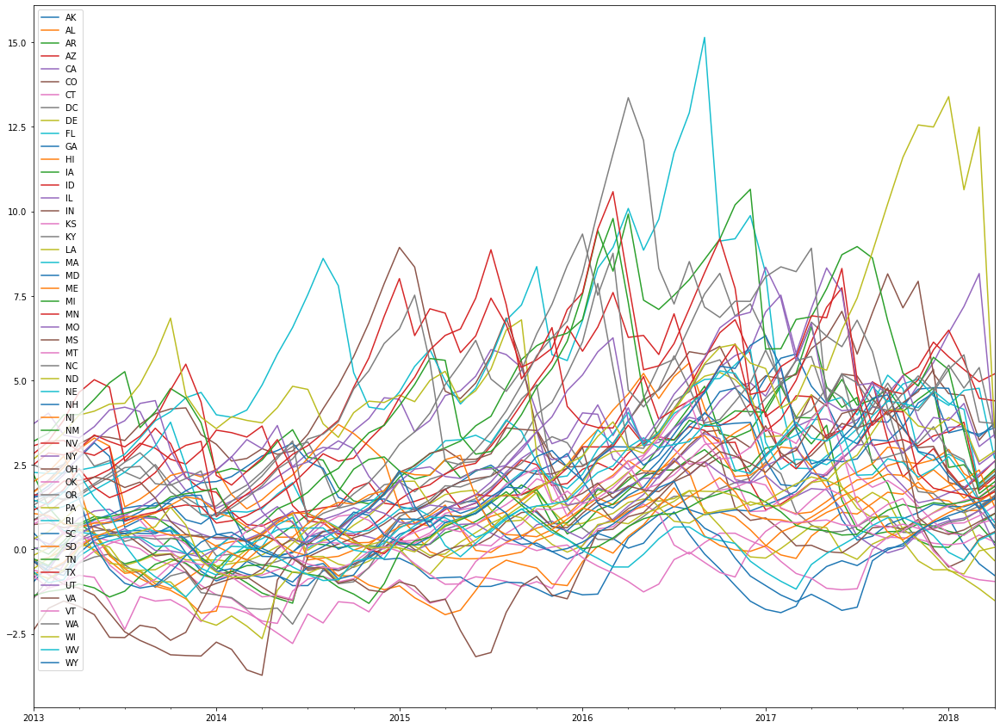

In [25]:
## plotting to see if all went through
fig, ax = plt.subplots(figsize=(20,15))
for state_df in state_dfs:
    state_df['2013':'2018'].sharpe_ratio_monthly.plot(label =state_df.columns[0], ax=ax)
plt.legend(loc=2)

In [26]:
st = []
average_5 = []
average_10 = []
avg_10_y = []
avg_5_y= []
avg_1_mo =[]
avg_1_y=[]
avg_3_mo =[]
avg_3_y=[]
for state in state_dfs:
    st.append(state.columns[0])
    avg_1_mo.append(state['2017-04-01':].sharpe_ratio_monthly.mean())
    avg_1_y.append(state['2017-04-01':].sharpe_ratio_annual.mean())
    average_5.append(state['2013':'2018'].sharpe_ratio_monthly.mean())
    average_10.append(state['2008':'2018'].sharpe_ratio_monthly.mean())
    avg_5_y.append(state['2013':'2018'].sharpe_ratio_annual.mean())
    avg_10_y.append(state['2008':'2018'].sharpe_ratio_annual.mean())
    avg_3_mo.append(state['2015-04-01':].sharpe_ratio_monthly.mean())
    avg_3_y.append(state['2015-04-01':].sharpe_ratio_annual.mean())

state_averages = pd.concat([pd.DataFrame(st,dtype='str'),pd.DataFrame(avg_1_mo,dtype=float),pd.DataFrame(avg_1_y,dtype=float),
                            pd.DataFrame(avg_3_mo,dtype=float),pd.DataFrame(avg_3_y,dtype=float),
                            pd.DataFrame(average_5,dtype=float),pd.DataFrame(avg_5_y,dtype=float),
                                pd.DataFrame(average_10,dtype=float),pd.DataFrame(avg_10_y,dtype=float)],axis=1)
state_averages.columns = ['state','1yr_average_mo','1yr_average_y',
                          '3yr_average_mo','3yr_average_y',
                          '5yr_average_mo','5yr_average_y',
                          '10yr_average_mo','10yr_average_y']


Text(0, 0.5, '10 Year Average Sharpe Ratio (annual)')

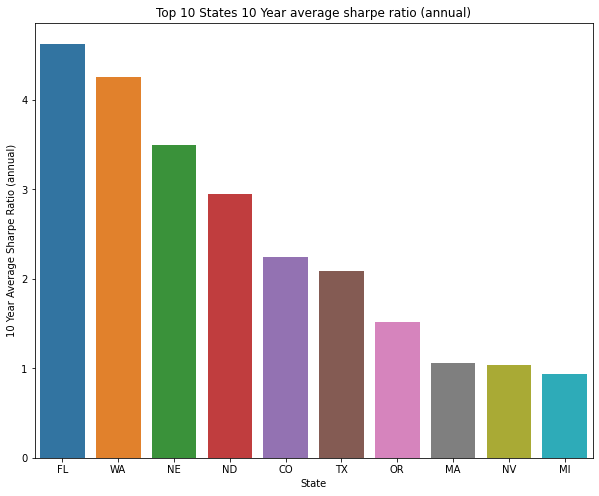

In [27]:
sns.barplot(x='state',y='10yr_average_y',data=state_averages.sort_values('10yr_average_y',ascending=False).head(10))
plt.title('Top 10 States 10 Year average sharpe ratio (annual)')
plt.xlabel('State')
plt.ylabel('10 Year Average Sharpe Ratio (annual)')

Text(0, 0.5, '10 Year Average Sharpe Ratio (monthly)')

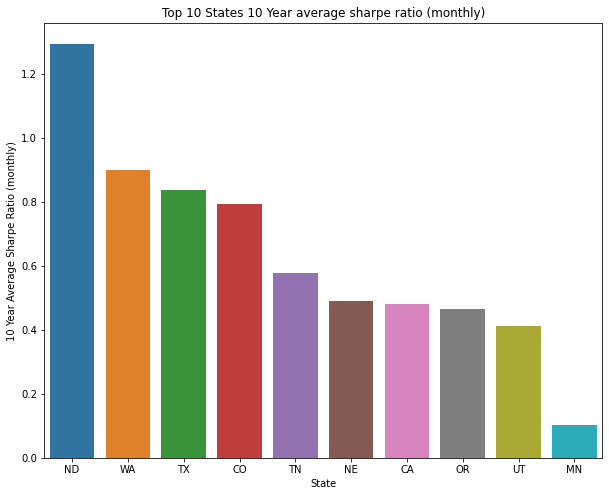

In [28]:
sns.barplot(x='state',y='10yr_average_mo',data=state_averages.sort_values('10yr_average_mo',ascending=False).head(10))
plt.title('Top 10 States 10 Year average sharpe ratio (monthly)')
plt.xlabel('State')
plt.ylabel('10 Year Average Sharpe Ratio (monthly)')

Looking at 10 year sharpe ratio which include the financial crisis of '08 WA, TX, CO, TN and CA are only states that where able to have positive sharpe ratios throughtout those volatile times pointing to a bit of safety in large market swings such as '08

Text(0, 0.5, '5 Year Average Sharpe Ratio (monthly)')

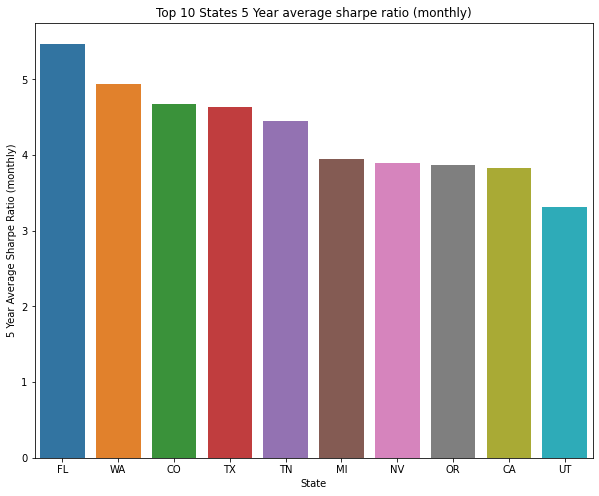

In [29]:
sns.barplot(x='state',y='5yr_average_mo',data=state_averages.sort_values('5yr_average_mo',ascending=False).head(10))
plt.title('Top 10 States 5 Year average sharpe ratio (monthly)')
plt.xlabel('State')
plt.ylabel('5 Year Average Sharpe Ratio (monthly)')

When only looking at 5yr sharpe ratios WA CO TX TN CA are still among the top 10 list but notice FL is now top performing state which may indicate that in FL, absent of a large downturn in the housing market, would provide the best risk adjusted returns

In [30]:
st10 = list(state_averages.sort_values('10yr_average_mo',ascending=False).state.head(10))
st10

['ND', 'WA', 'TX', 'CO', 'TN', 'NE', 'CA', 'OR', 'UT', 'MN']

In [31]:
st5 = list(state_averages.sort_values('5yr_average_mo',ascending=False).state.head(10))
st5

['FL', 'WA', 'CO', 'TX', 'TN', 'MI', 'NV', 'OR', 'CA', 'UT']

In [32]:
st3 = list(state_averages.sort_values('3yr_average_mo',ascending=False).state.head(10))
st1

NameError: name 'st1' is not defined

In [34]:
st1 = list(state_averages.sort_values('1yr_average_mo',ascending=False).state.head(10))
st1

['WI', 'CO', 'TN', 'WA', 'CA', 'MO', 'NV', 'OR', 'MA', 'AZ']

Text(0.5, 1.0, 'Top 10 States by 5 year Sharpe Ratio (annual)')

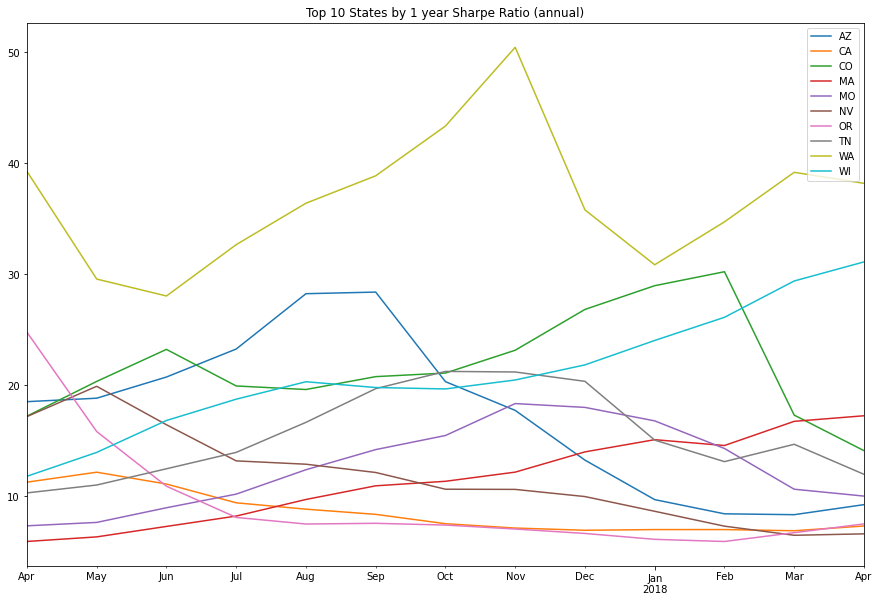

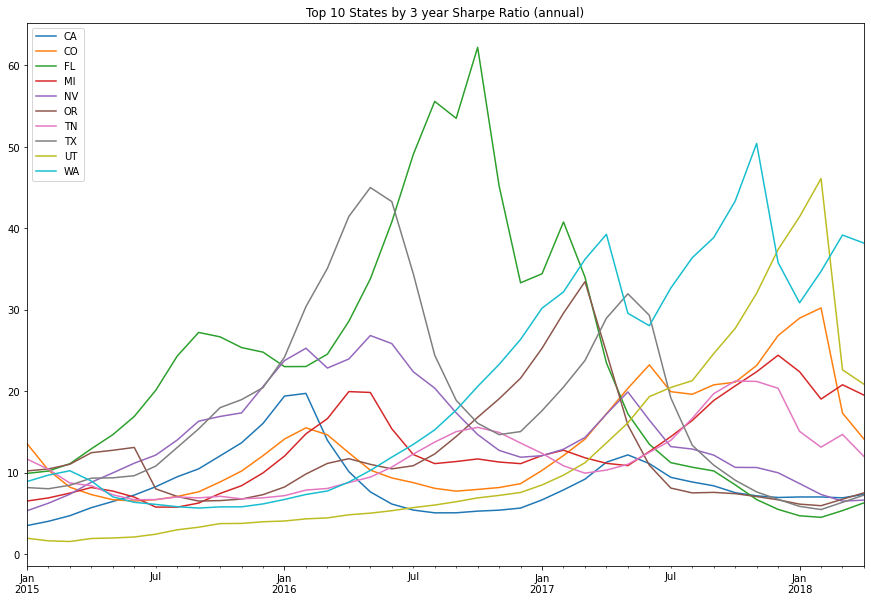

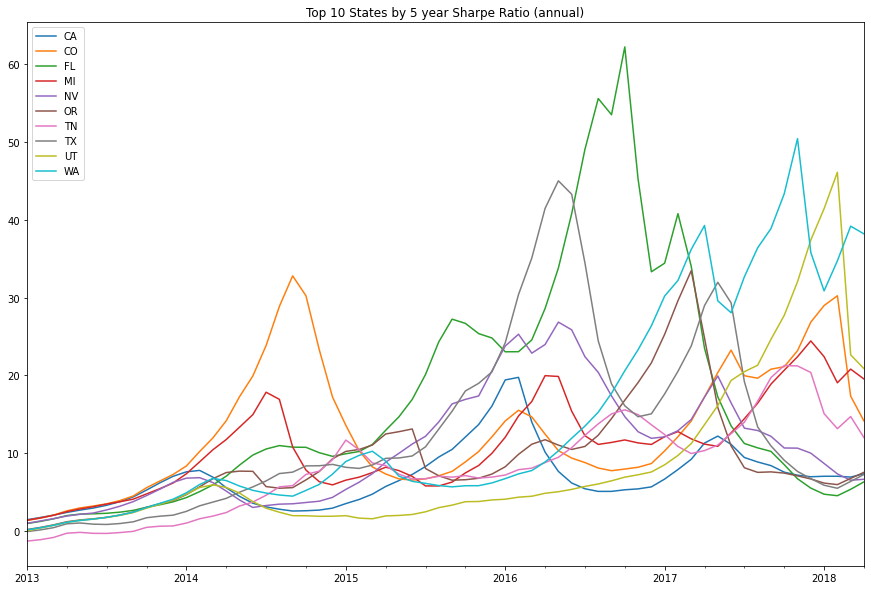

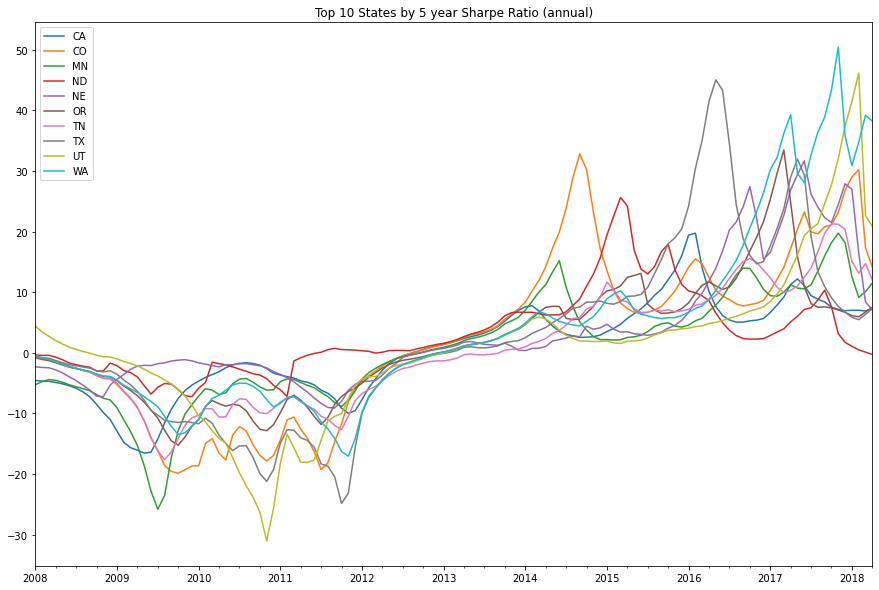

In [35]:
fig1, ax1 = plt.subplots(figsize=(15,10))
for state_df in state_dfs:
    for x in st1:
        if x in state_df.columns[0]:
            state_df['2017-04-01':'2018'].sharpe_ratio_annual.plot(label=state_df.columns[0],ax=ax1)
        else: continue
plt.legend()
plt.title('Top 10 States by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(15,10))
for state_df in state_dfs:
    for x in st5:
        if x in state_df.columns[0]:
            state_df['2015':].sharpe_ratio_annual.plot(label=state_df.columns[0])
        else: continue
plt.legend()
plt.title('Top 10 States by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(15,10))
for state_df in state_dfs:
    for x in st5:
        if x in state_df.columns[0]:
            state_df['2013':'2018'].sharpe_ratio_annual.plot(label=state_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 States by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(15,10))
for state_df in state_dfs:
    for x in st10:
        if x in state_df.columns[0]:
            state_df['2008':'2018'].sharpe_ratio_annual.plot(label=state_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 States by 5 year Sharpe Ratio (annual)')

Looking at the most recent year, Washington, Wisconsin, and Massachussets are highest performing states wrt sharpe ratio

For 3 year time horizon, this remains the same, and with broader context these states are in an uptrend

for 5 year also same results but this in on YoY comparison so smoothes out trends

## Looking at Counties

In [36]:
counties = df.drop(columns=['RegionID','RegionName', 'City', 'Metro', 'State','SizeRank'],axis=1).groupby('CountyName').mean()
counties = pd.DataFrame(counties.reset_index())
county_columns = list(counties.T.iloc[0])
counties = counties.T
counties.columns = county_columns
counties = counties[1:]
counties = counties.set_index(pd.to_datetime(counties.index))
counties = counties.applymap(lambda x: round(np.float(x),2))

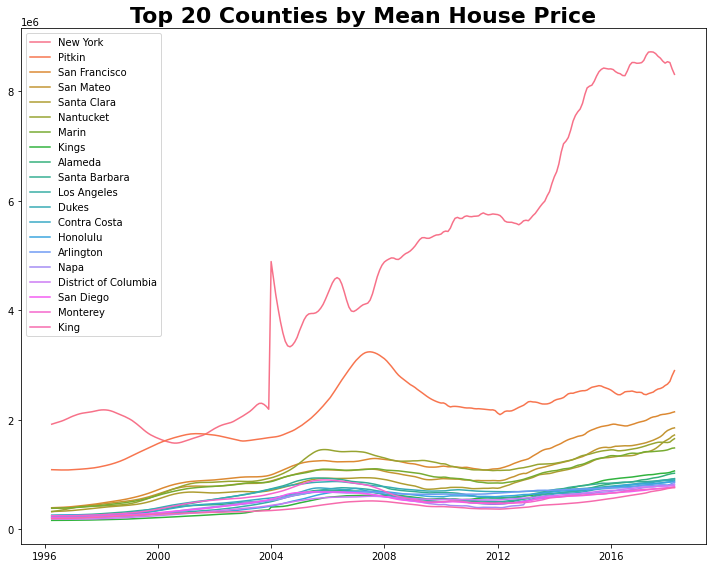

In [37]:
top20counties = list(counties.iloc[-1,:].sort_values(ascending=False).head(20).index)
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
rcParams['figure.figsize'] = 10,8
sns.lineplot(data=counties[top20counties],dashes=False)
plt.title('Top 20 Counties by Mean House Price',font=font)
plt.tight_layout()

No surprise New York County is certainly the most expensive by a vast margin followed by Pitkin and San Francisco

Notably, New york is in a decline from peak levels in 2016 while Pitkin is in an uptrend

After these counties and 3 or so others prices are hard to distinguish

In [275]:
county_list = list(counties.columns)
len(county_list)

1212

In [39]:
county_dfs = []
for x in county_list:
    x = pd.DataFrame(data = counties[x],)
    county_dfs.append(x)

In [40]:
county_dfs[0].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 265 entries, 1996-04-01 to 2018-04-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Acadia  265 non-null    float64
dtypes: float64(1)
memory usage: 4.1 KB


In [41]:
for county_df in county_dfs:
    county_df['ROI_MoM'] = np.zeros((265))
    county_df['ROI_YoY'] = np.zeros((265))
    for x in range(0,265):    
        if x + 1 <265:
            county_df.iloc[x+1,1] = round((county_df.iloc[x+1,0] - county_df.iloc[x,0])/county_df.iloc[x,0],4)
        else: break
    for x in range(0,265):    
        if x + 12 <265:
            county_df.iloc[x+12,2] = round((county_df.iloc[x+12,0] - county_df.iloc[x,0])/county_df.iloc[x,0],4)
        else: break
    county_df['EMA_6MO_roi_mo'] = county_df.ROI_MoM.ewm(span=6,adjust=False).mean()
    county_df['EMA_6MO_std_mo'] = county_df.ROI_MoM.ewm(span=6,adjust=False).std()
    county_df['EMA_6MO_roi_y'] = county_df.ROI_YoY.ewm(span=6,adjust=False).mean()
    county_df['EMA_6MO_std_y'] = county_df.ROI_YoY.ewm(span=6,adjust=False).std()
    county_df['rfr'] = rfr.DGS10
    county_df['sharpe_ratio_monthly'] = (county_df['EMA_6MO_roi_mo'] - (county_df.rfr/12))/county_df['EMA_6MO_std_mo']
    county_df['sharpe_ratio_annual'] = (county_df['EMA_6MO_roi_y'] - (county_df.rfr))/county_df['EMA_6MO_std_y']

In [42]:
ct = []
avg_5_mo = []
avg_5_y = []
avg_10_mo = []
avg_10_y= []
avg_1_mo =[]
avg_1_y=[]
avg_3_mo = []
avg_3_y = []
for county in county_dfs:
    ct.append(county.columns[0])
    avg_1_mo.append(county['2017-04-01':].sharpe_ratio_monthly.mean())
    avg_1_y.append(county['2017-04-01':].sharpe_ratio_annual.mean())
    avg_5_mo.append(county['2013':'2018'].sharpe_ratio_monthly.mean())
    avg_5_y.append(county['2013':'2018'].sharpe_ratio_annual.mean())
    avg_10_mo.append(county['2008':'2018'].sharpe_ratio_monthly.mean())
    avg_10_y.append(county['2008':'2018'].sharpe_ratio_annual.mean())
    avg_3_mo.append(county['2015-04-01':].sharpe_ratio_monthly.mean())
    avg_3_y.append(county['2015-04-01':].sharpe_ratio_annual.mean())
county_averages = pd.concat([pd.DataFrame(ct,dtype='str'),pd.DataFrame(avg_1_mo,dtype=float),pd.DataFrame(avg_1_y,dtype=float),
                            pd.DataFrame(avg_3_mo,dtype=float),pd.DataFrame(avg_3_y,dtype=float),
                            pd.DataFrame(avg_5_mo,dtype=float),pd.DataFrame(avg_5_y,dtype=float),
                                pd.DataFrame(avg_10_mo,dtype=float),pd.DataFrame(avg_10_y,dtype=float)],axis=1)
county_averages.columns = ['county','1yr_average_mo','1yr_average_y',
                          '3yr_average_mo','3yr_average_y',
                          '5yr_average_mo','5yr_average_y',
                          '10yr_average_mo','10yr_average_y']


In [276]:
## no duplicate counties
county_averages.county.duplicated().sum()

0

In [44]:
county_averages.sort_values('10yr_average_mo',ascending=False).head(10)

,county,1yr_average_mo,1yr_average_y,3yr_average_mo,3yr_average_y,5yr_average_mo,5yr_average_y,10yr_average_mo,10yr_average_y
1160,Weld,2.978539,10.864722,3.490653,13.983613,4.791624,11.705562,1.510904,2.742040
26,Arapahoe,2.435483,12.096049,3.877805,9.659439,3.946555,9.144958,1.349821,2.647306
1043,Stutsman,0.609223,3.707633,1.137632,4.685899,2.380254,6.571210,1.295704,3.208507
101,Bottineau,1.480174,5.867193,2.074726,7.888051,2.090334,7.676780,1.249943,4.454781
1101,Uintah,6.091715,12.836897,5.210016,10.970244,4.066645,8.077180,1.212724,1.378754
1063,Tarrant,4.268761,16.906491,5.679534,13.607377,4.101728,9.041270,1.159421,2.640335
736,Morton,-0.001875,-0.037152,0.610232,2.533059,1.715236,4.517546,1.099789,2.700974
385,Gaines,1.600449,7.970290,2.449739,10.986220,2.689594,9.305772,1.097479,3.746491
570,King,3.333670,31.328247,5.433629,21.174357,4.377548,14.309619,1.066469,4.646510
51,Barnes,-0.103402,0.029829,0.435432,2.531147,1.518385,4.655364,1.005266,2.909366


In [45]:
counties["Skagit"].mean()

222514.19811320756

In [46]:
ct10= []
ct10 = list(county_averages.sort_values('10yr_average_mo',ascending=False).county.head(10))
ct10

['Weld',
 'Arapahoe',
 'Stutsman',
 'Bottineau',
 'Uintah',
 'Tarrant',
 'Morton',
 'Gaines',
 'King',
 'Barnes']

In [47]:
ct5 = list(county_averages.sort_values('5yr_average_mo',ascending=False).county.head(10))
ct5

['Weld',
 'King',
 'Tarrant',
 'Uintah',
 'Arapahoe',
 'Clark',
 'Davidson',
 'Denver',
 'Payette',
 'Glenn']

In [48]:
ct3 = list(county_averages.sort_values('3yr_average_mo',ascending=False).county.head(10))
ct3

['Tarrant',
 'King',
 'Uintah',
 'Clark',
 'Jefferson',
 'Denver',
 'Payette',
 'Hood River',
 'Davidson',
 'Skagit']

In [49]:
ct1 = list(county_averages.sort_values('1yr_average_mo',ascending=False).county.head(10))
ct1

['Uintah',
 'Citrus',
 'Seminole',
 'Snohomish',
 'Skagit',
 'Mecklenburg',
 'Carson City',
 'Kent',
 'Clark',
 'Knox']

In [282]:
df.loc[df['City']=="Sky Lake"].CountyName

4734    Orange
Name: CountyName, dtype: object

Text(0.5, 1.0, 'Top 10 Counties by 10 year Sharpe Ratio (annual)')

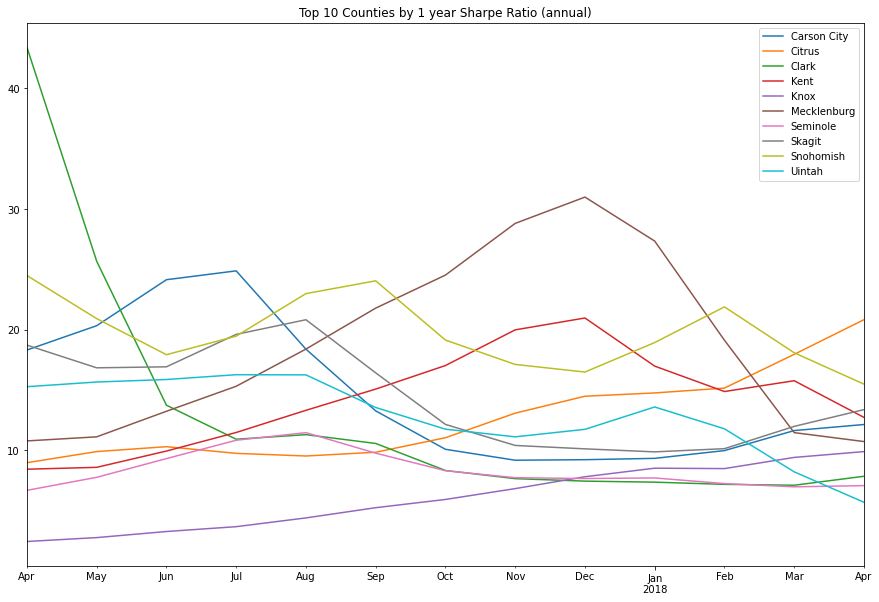

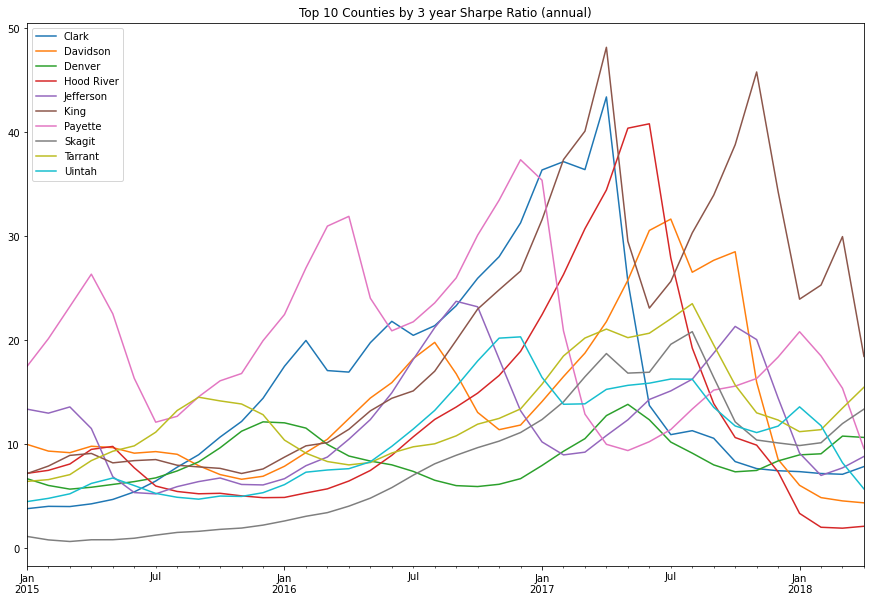

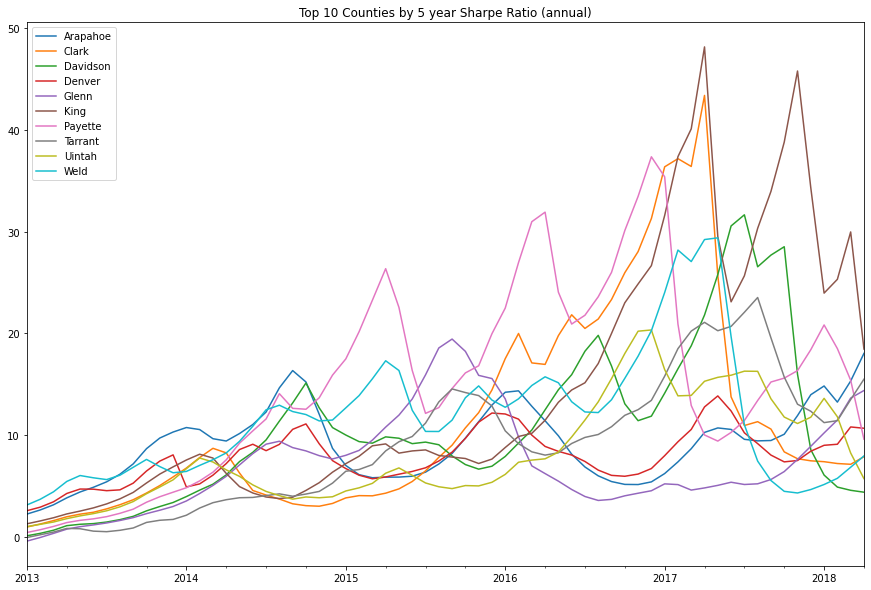

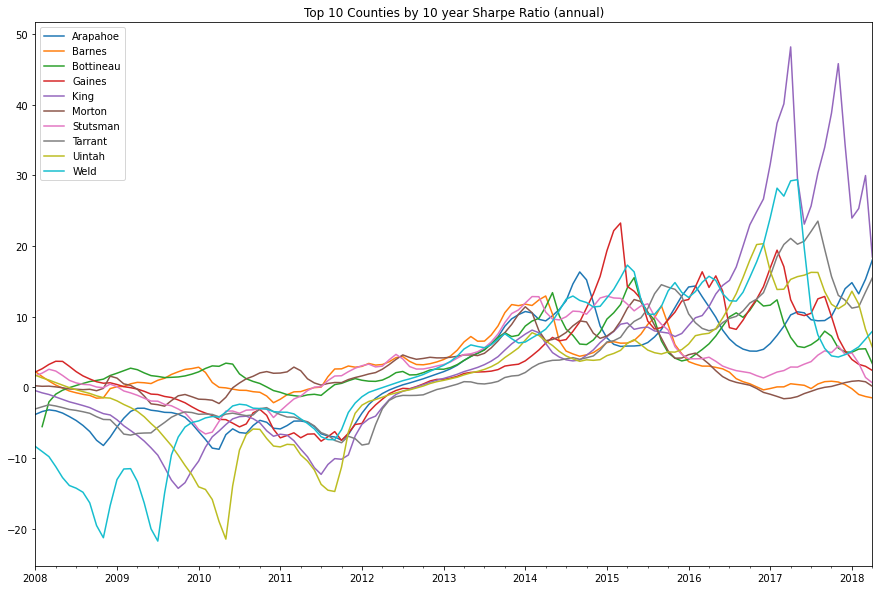

In [50]:
fig1, ax1 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct1:
        if x == county_df.columns[0]:
            county_df['2017-04-01':'2018'].sharpe_ratio_annual.plot(label=county_df.columns[0],ax=ax1)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct3:
        if x == county_df.columns[0]:
            county_df['2015':].sharpe_ratio_annual.plot(label=county_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct5:
        if x == county_df.columns[0]:
            county_df['2013':'2018'].sharpe_ratio_annual.plot(label=county_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct10:
        if x == county_df.columns[0]:
            county_df['2008':'2018'].sharpe_ratio_annual.plot(label=county_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 10 year Sharpe Ratio (annual)')

Araphoe, Glenn, Tarrant, King (maybe) could be late to the game there but still in 20s sharpe tbd but that gives us texas CO and WA

Text(0.5, 1.0, 'Top 10 Counties by 10 year Sharpe Ratio (mo)')

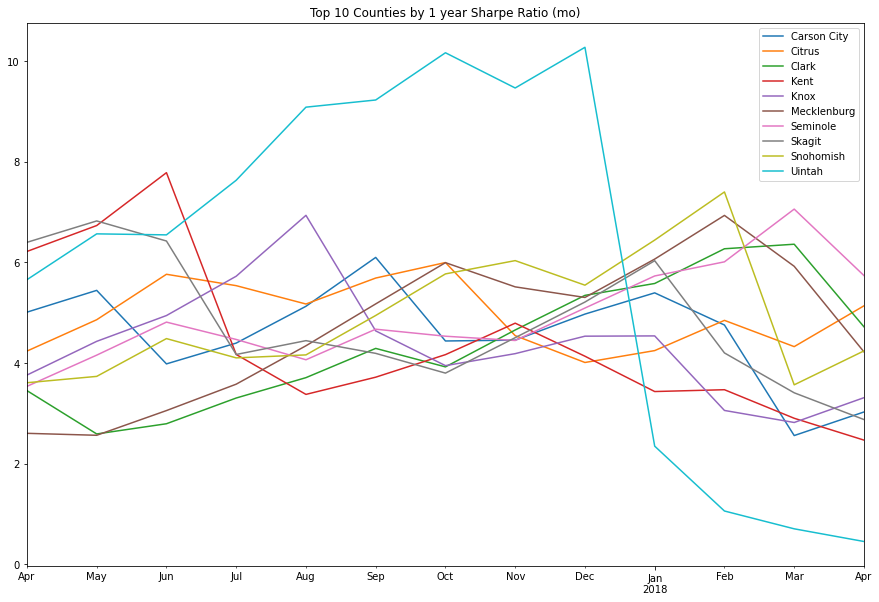

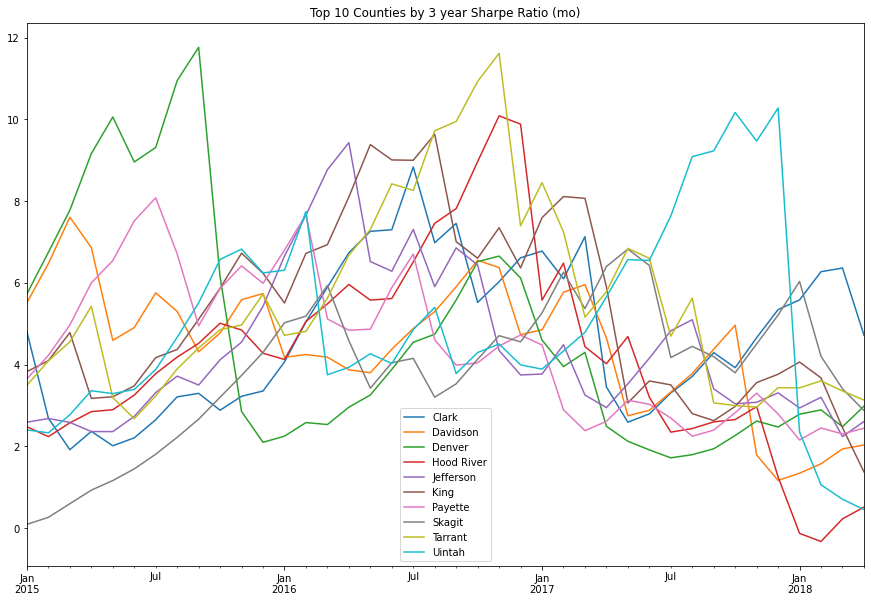

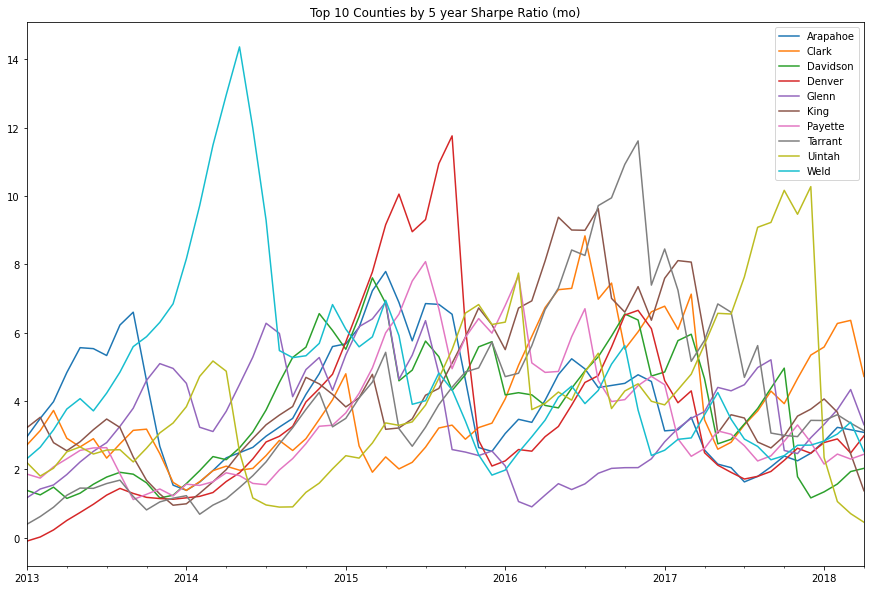

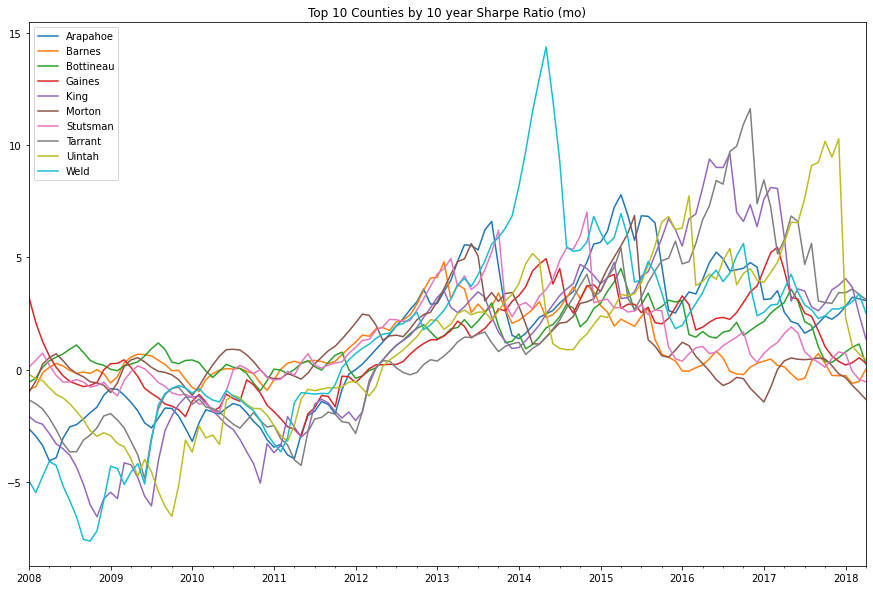

In [51]:
fig1, ax1 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct1:
        if x == county_df.columns[0]:
            county_df['2017-04-01':'2018'].sharpe_ratio_monthly.plot(label=county_df.columns[0],ax=ax1)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 1 year Sharpe Ratio (mo)')

fig, ax = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct3:
        if x == county_df.columns[0]:
            county_df['2015':].sharpe_ratio_monthly.plot(label=county_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 3 year Sharpe Ratio (mo)')



fig2, ax2 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct5:
        if x == county_df.columns[0]:
            county_df['2013':'2018'].sharpe_ratio_monthly.plot(label=county_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 5 year Sharpe Ratio (mo)')

fig3, ax3 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct10:
        if x == county_df.columns[0]:
            county_df['2008':'2018'].sharpe_ratio_monthly.plot(label=county_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 10 year Sharpe Ratio (mo)')

Text(0.5, 1.0, 'Top 10 Counties ROI by 10 year Sharpe Ratio (annual)')

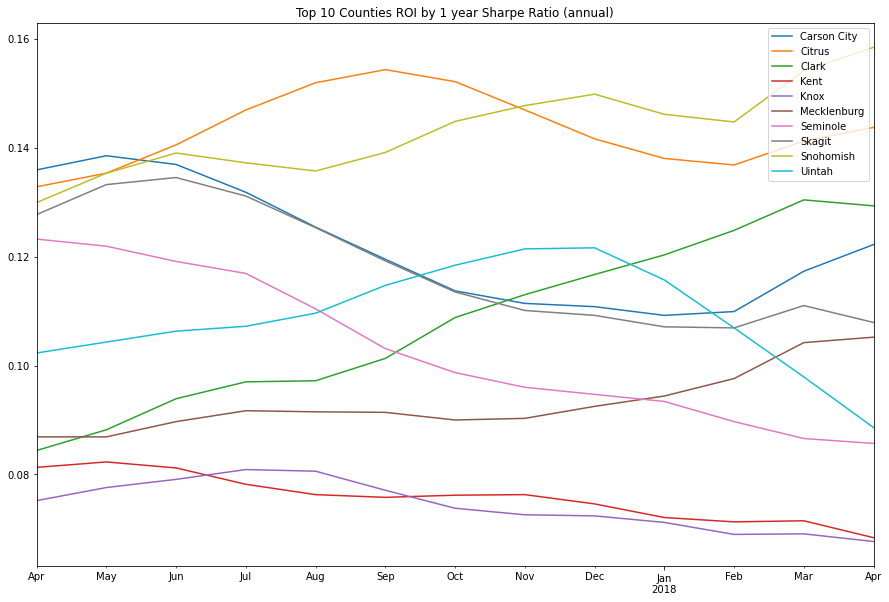

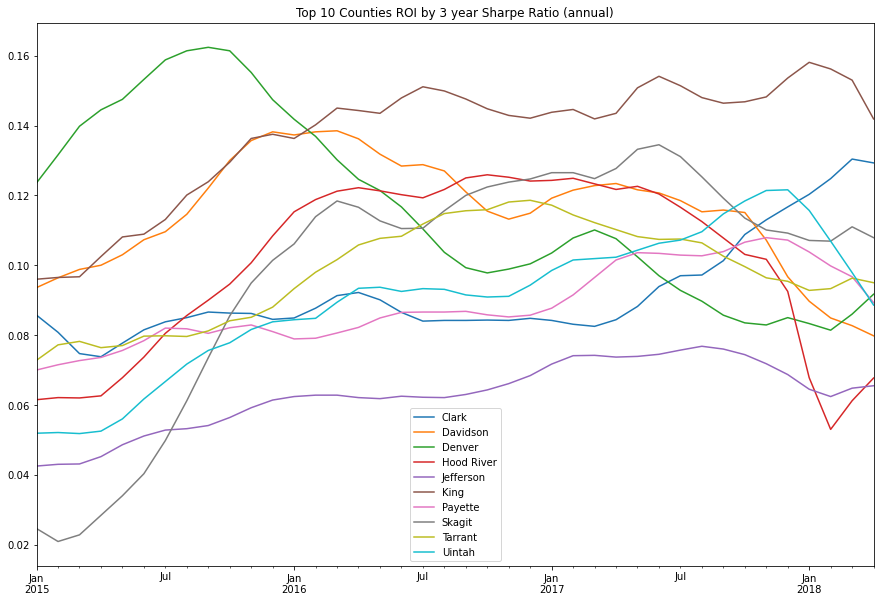

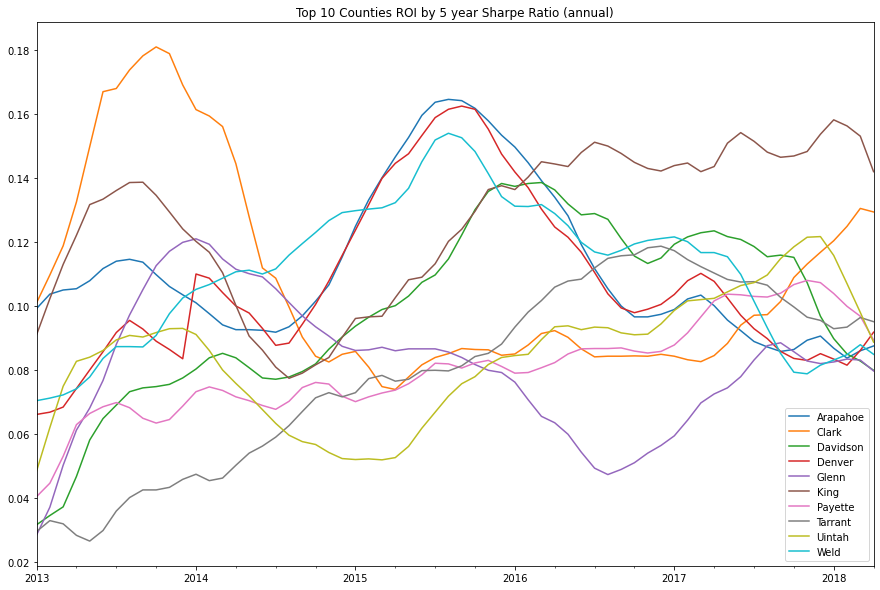

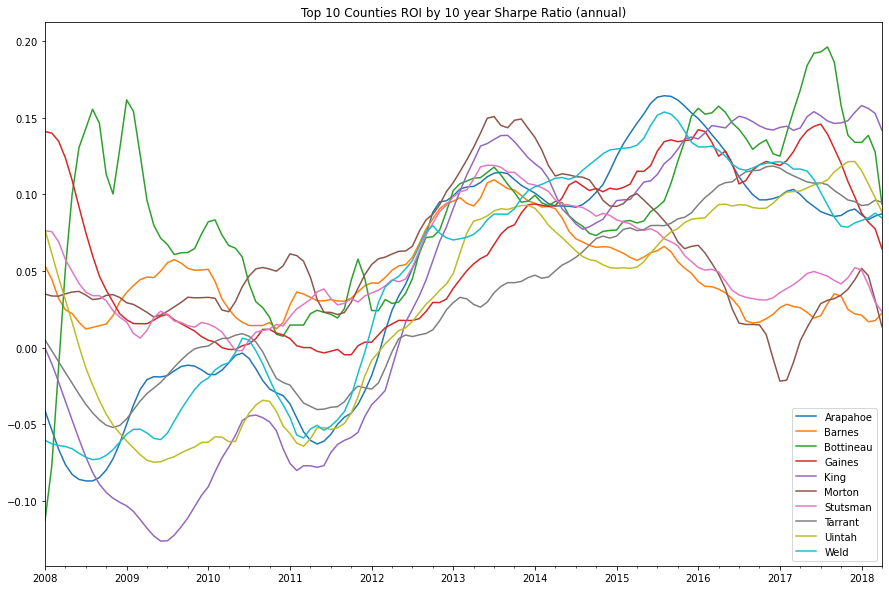

In [52]:
fig1, ax1 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct1:
        if x == county_df.columns[0]:
            county_df['2017-04-01':'2018'].ROI_YoY.plot(label=county_df.columns[0],ax=ax1)
        else: continue
plt.legend()
plt.title('Top 10 Counties ROI by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct3:
        if x == county_df.columns[0]:
            county_df['2015':].ROI_YoY.plot(label=county_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties ROI by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct5:
        if x == county_df.columns[0]:
            county_df['2013':'2018'].ROI_YoY.plot(label=county_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 Counties ROI by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct10:
        if x == county_df.columns[0]:
            county_df['2008':'2018'].ROI_YoY.plot(label=county_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 Counties ROI by 10 year Sharpe Ratio (annual)')

In [54]:
df[df.CountyName == 'Arapahoe']

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
129,93203,80013,Aurora,CO,Denver,...,329600,332600,335600,339000,341300
300,93205,80015,Aurora,CO,Denver,...,390300,393400,396100,399500,401800
662,93206,80016,Aurora,CO,Denver,...,531300,535700,540000,544500,547200
781,93202,80012,Aurora,CO,Denver,...,307400,311300,314800,318600,321100
887,93204,80014,Aurora,CO,Denver,...,336800,339900,342800,346300,348800
1201,93201,80011,Aurora,CO,Denver,...,283700,286400,289300,293400,296400
2341,93244,80112,Centennial,CO,Denver,...,474000,477400,480900,486300,490500
2431,93207,80017,Aurora,CO,Denver,...,306500,309100,311800,315000,317300
2470,93200,80010,Aurora,CO,Denver,...,264000,266500,269500,274100,277600
2789,93243,80111,Greenwood Village,CO,Denver,...,642400,647500,654300,662000,666300


## Looking at Cities

In [55]:
cities = df.drop(columns=['RegionID','RegionName', 'CountyName', 'Metro', 'State','SizeRank'],axis=1).groupby('City').mean()
cities = pd.DataFrame(cities.reset_index())
city_columns = list(cities.T.iloc[0])
cities = cities.T
cities.columns = city_columns
cities = cities[1:]
cities = cities.set_index(pd.to_datetime(cities.index))
cities = cities.applymap(lambda x: round(np.float(x),2))

In [56]:
cities

,Abbeville,Aberdeen,Abilene,Abingdon,Abington,...,Zionsville,Zionville,Zumbro Falls,Zumbrota,Zuni
1996-04-01,47900.0,85575.0,62300.00,73575.0,144780.0,...,252600.0,68600.0,103500.0,88500.0,80200.0
1996-05-01,47900.0,85675.0,62316.67,73725.0,144640.0,...,255300.0,68700.0,103900.0,88300.0,80500.0
1996-06-01,48000.0,85800.0,62350.00,73850.0,144460.0,...,258600.0,68800.0,104200.0,88000.0,80800.0
1996-07-01,48100.0,85900.0,62383.33,74000.0,144260.0,...,262400.0,68900.0,104400.0,87700.0,81100.0
1996-08-01,48200.0,86050.0,62483.33,74175.0,144120.0,...,266400.0,69000.0,104600.0,87400.0,81400.0
...,...,...,...,...,...,...,...,...,...,...,...
2017-12-01,76200.0,136540.0,127183.33,156525.0,306980.0,...,382700.0,165800.0,258500.0,190800.0,185500.0
2018-01-01,77500.0,136940.0,128100.00,156625.0,310240.0,...,383300.0,162700.0,255400.0,192300.0,183300.0
2018-02-01,77300.0,137340.0,128666.67,157050.0,312580.0,...,385300.0,162100.0,256100.0,193000.0,183400.0
2018-03-01,75600.0,137860.0,128900.00,157700.0,314420.0,...,390400.0,163300.0,260400.0,192600.0,187200.0


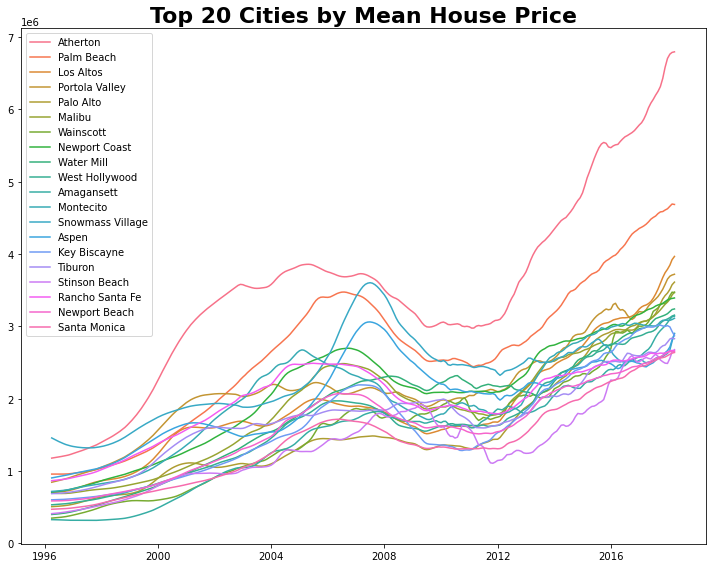

In [57]:
top20cities = list(cities.iloc[-1,:].sort_values(ascending=False).head(20).index)
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
rcParams['figure.figsize'] = 10,8
sns.lineplot(data=cities[top20cities],dashes=False)
plt.title('Top 20 Cities by Mean House Price',font=font)
plt.tight_layout()

In [58]:
city_list = list(cities.columns)
len(city_list)

7554

In [59]:
city_dfs = []
for x in city_list:
    x = pd.DataFrame(data = cities[x])
    city_dfs.append(x)

In [60]:
for city_df in city_dfs:
    city_df['ROI_MoM'] = np.zeros((265))
    city_df['ROI_YoY'] = np.zeros((265))
    for x in range(0,265):    
        if x + 1 <265:
            city_df.iloc[x+1,1] = round((city_df.iloc[x+1,0] - city_df.iloc[x,0])/city_df.iloc[x,0],4)
        else: break
    for x in range(0,265):    
        if x + 12 <265:
            city_df.iloc[x+12,2] = round((city_df.iloc[x+12,0] - city_df.iloc[x,0])/city_df.iloc[x,0],4)
        else: break
    city_df['EMA_6MO_roi_mo'] = city_df.ROI_MoM.ewm(span=6,adjust=False).mean()
    city_df['EMA_6MO_std_mo'] = city_df.ROI_MoM.ewm(span=6,adjust=False).std()
    city_df['EMA_6MO_roi_y'] = city_df.ROI_YoY.ewm(span=6,adjust=False).mean()
    city_df['EMA_6MO_std_y'] = city_df.ROI_YoY.ewm(span=6,adjust=False).std()
    city_df['rfr'] = rfr.DGS10
    city_df['sharpe_ratio_monthly'] = (city_df['EMA_6MO_roi_mo'] - (city_df.rfr/12))/city_df['EMA_6MO_std_mo']
    city_df['sharpe_ratio_annual'] = (city_df['EMA_6MO_roi_y'] - (city_df.rfr))/city_df['EMA_6MO_std_y']

In [61]:
cities.columns

Index(['Abbeville', 'Aberdeen', 'Abilene', 'Abingdon', 'Abington',
       'Abita Springs', 'Absecon', 'Acampo', 'Accident', 'Accokeek',
       ...
       'Zephyr Cove', 'Zephyrhills', 'Zillah', 'Zimmerman', 'Zion',
       'Zionsville', 'Zionville', 'Zumbro Falls', 'Zumbrota', 'Zuni'],
      dtype='object', length=7554)

In [62]:
cty = list(cities.columns)
avg_5_mo = []
avg_5_y = []
avg_10_mo = []
avg_10_y= []
avg_1_mo =[]
avg_1_y=[]
avg_3_mo = []
avg_3_y = []
for city in city_dfs:
    avg_1_mo.append(city['2017-04-01':].sharpe_ratio_monthly.mean())
    avg_1_y.append(city['2017-04-01':].sharpe_ratio_annual.mean())
    avg_5_mo.append(city['2013':'2018'].sharpe_ratio_monthly.mean())
    avg_5_y.append(city['2013':'2018'].sharpe_ratio_annual.mean())
    avg_10_mo.append(city['2008':'2018'].sharpe_ratio_monthly.mean())
    avg_10_y.append(city['2008':'2018'].sharpe_ratio_annual.mean())
    avg_3_mo.append(city['2015-04-01':].sharpe_ratio_monthly.mean())
    avg_3_y.append(city['2015-04-01':].sharpe_ratio_annual.mean())
city_averages = pd.concat([pd.DataFrame(cty,dtype='str'),pd.DataFrame(avg_1_mo,dtype=float),pd.DataFrame(avg_1_y,dtype=float),
                            pd.DataFrame(avg_3_mo,dtype=float),pd.DataFrame(avg_3_y,dtype=float),
                            pd.DataFrame(avg_5_mo,dtype=float),pd.DataFrame(avg_5_y,dtype=float),
                                pd.DataFrame(avg_10_mo,dtype=float),pd.DataFrame(avg_10_y,dtype=float)],axis=1)
city_averages.columns = ['city','1yr_average_mo','1yr_average_y',
                          '3yr_average_mo','3yr_average_y',
                          '5yr_average_mo','5yr_average_y',
                          '10yr_average_mo','10yr_average_y']

In [94]:
cty10 = list(city_averages.sort_values('10yr_average_mo',ascending=False).city.head(20))
cty5 = list(city_averages.sort_values('5yr_average_mo',ascending=False).city.head(20))
cty3 =list(city_averages.sort_values('3yr_average_mo',ascending=False).city.head(20))
cty1 =list(city_averages.sort_values('1yr_average_mo',ascending=False).city.head(20))

In [125]:
city_averages.loc[city_averages['city'].isin(cty5)]

,city,1yr_average_mo,1yr_average_y,3yr_average_mo,3yr_average_y,5yr_average_mo,5yr_average_y,10yr_average_mo,10yr_average_y
251,Aurora,3.680525,19.538357,5.005111,15.757518,4.208762,12.047748,0.747153,3.170836
421,Bellevue,3.982448,15.331725,5.422543,13.747613,4.496723,10.172347,1.174092,2.848936
627,Bothell,4.953046,13.798557,4.919993,12.612951,3.725433,8.960386,0.565424,1.548973
775,Bryn Mawr-Skyway,3.367006,24.658597,6.127059,15.971921,4.054054,10.167322,0.631708,1.452014
805,Burien,2.766630,21.444547,5.442464,15.813449,4.222897,11.058368,0.709337,-0.202357
2615,Greeley,6.324529,20.120449,4.954574,15.199436,4.309201,13.102840,1.136645,3.364078
3010,Hood River,3.765993,17.361474,5.644754,13.062428,4.011942,8.751796,1.083769,2.596396
3176,Issaquah,2.426710,13.044601,5.396611,16.853265,4.216792,12.498783,1.199257,4.351098
3531,Lakewood,4.311984,14.136315,5.202873,11.392309,4.010283,8.117444,0.559195,1.195958
3614,Lehigh Acres,3.339292,11.484652,3.954301,18.699794,3.864071,14.023641,0.621132,4.487627


To note, when looking solely at the mean the names of cities I am selecting don't necesarrily have the highest Sharpe Ratio for the periods per se. This is because I am also taking into account current direction/trend. For example, Shoreline, Bryn Mawr-Skyway, and Burien all have higher 1 yr and 3yr avg sharpe ratios, but they are all trending down when looking at the graph relative to the other cities

In [124]:
city_averages.loc[city_averages['city'].isin(look)]

,city,1yr_average_mo,1yr_average_y,3yr_average_mo,3yr_average_y,5yr_average_mo,5yr_average_y,10yr_average_mo,10yr_average_y
251,Aurora,3.680525,19.538357,5.005111,15.757518,4.208762,12.047748,0.747153,3.170836
421,Bellevue,3.982448,15.331725,5.422543,13.747613,4.496723,10.172347,1.174092,2.848936
2074,Everett,5.622017,25.795327,4.441518,15.946671,3.400608,10.769721,0.109699,2.075337
2278,Fort Worth,5.380179,37.981856,5.020501,20.802625,3.581758,13.049024,0.796243,4.125678
2615,Greeley,6.324529,20.120449,4.954574,15.199436,4.309201,13.102840,1.136645,3.364078
3531,Lakewood,4.311984,14.136315,5.202873,11.392309,4.010283,8.117444,0.559195,1.195958
6096,Seattle,3.784218,16.808792,5.455047,12.398696,4.232504,8.784774,1.223238,2.375805
6250,Sky Lake,6.247035,19.263661,3.991221,12.208059,2.755823,7.921848,0.197859,1.514534
6680,Tenino,6.369002,14.945584,3.646003,8.053357,2.201364,4.695812,-0.235854,-0.258745


Text(0.5, 1.0, 'Top 20 Cities by 10 year Sharpe Ratio (annual)')

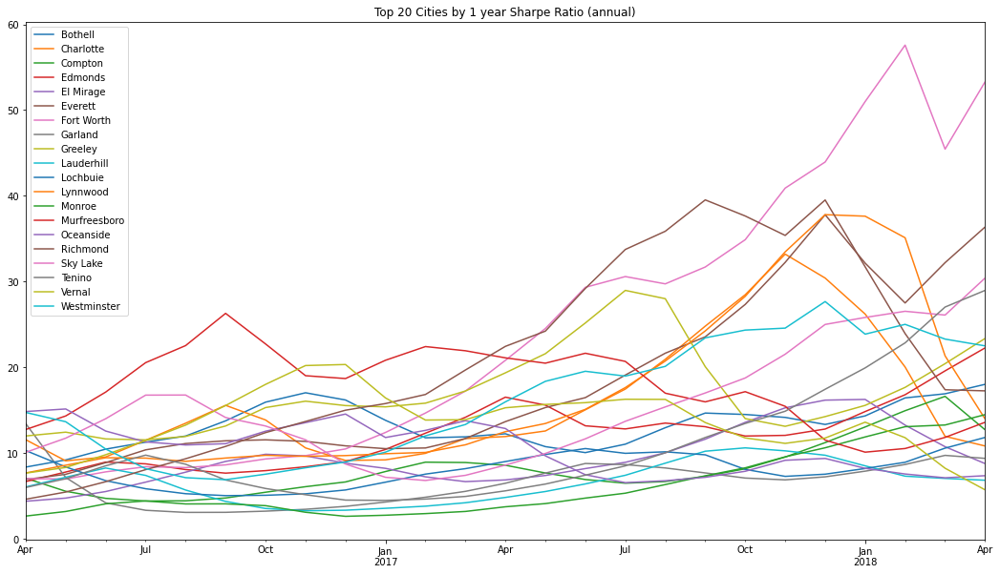

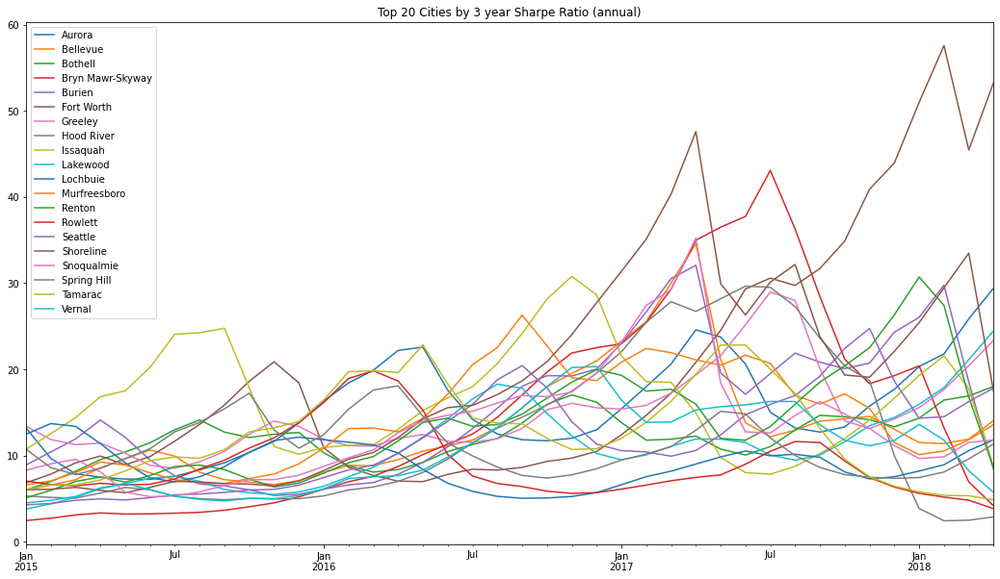

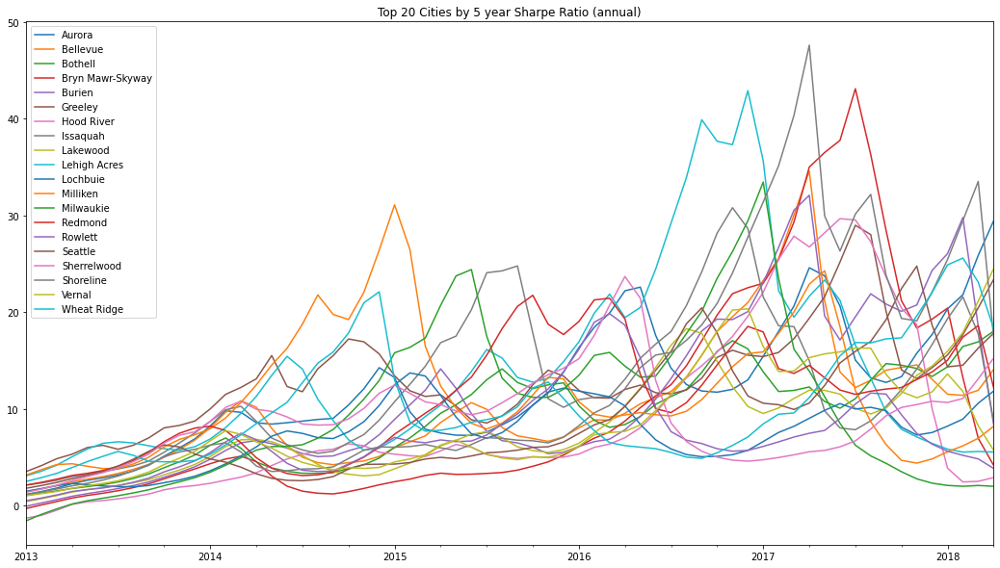

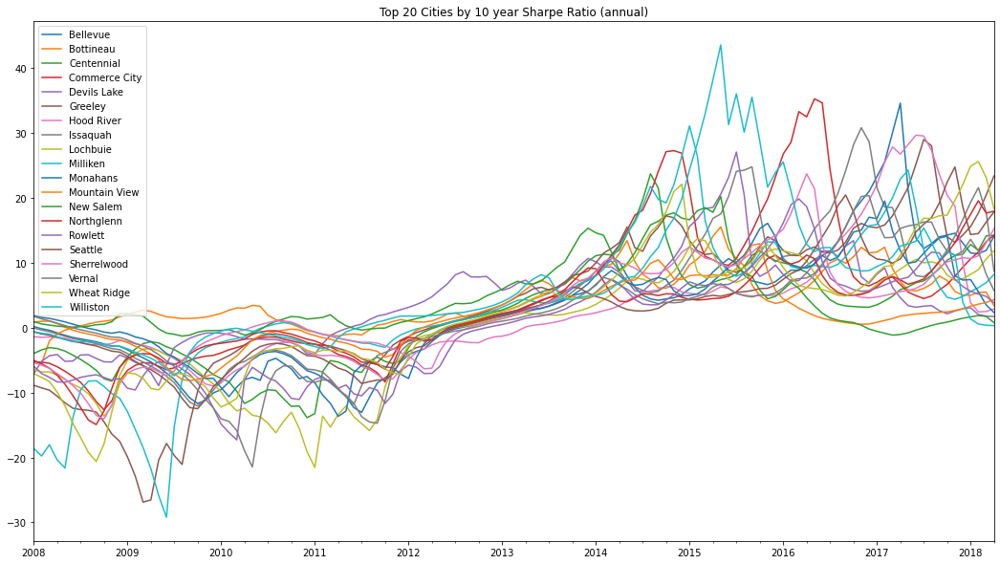

In [95]:
fig1, ax1 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty1:
        if x == city_df.columns[0]:
            city_df['2016-04-01':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax1,)
        else: continue
plt.legend()
plt.title('Top 20 Cities by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty3:
        if x == city_df.columns[0]:
            city_df['2015':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 20 Cities by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty5:
        if x == city_df.columns[0]:
            city_df['2013':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 20 Cities by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty10:
        if x == city_df.columns[0]:
            city_df['2008':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 20 Cities by 10 year Sharpe Ratio (annual)')

Text(0.5, 1.0, 'Top 10 Cities by 10 year Sharpe Ratio (annual)')

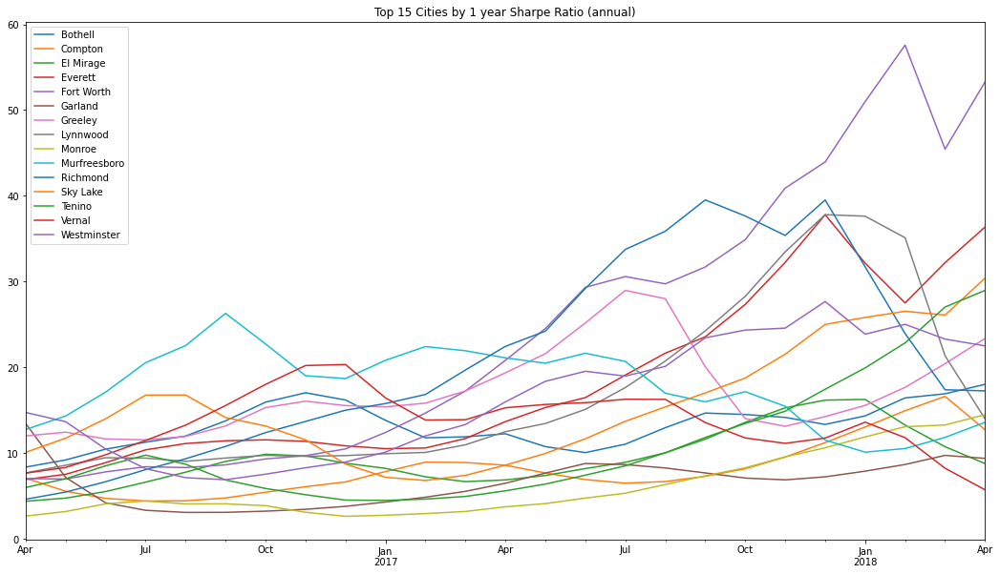

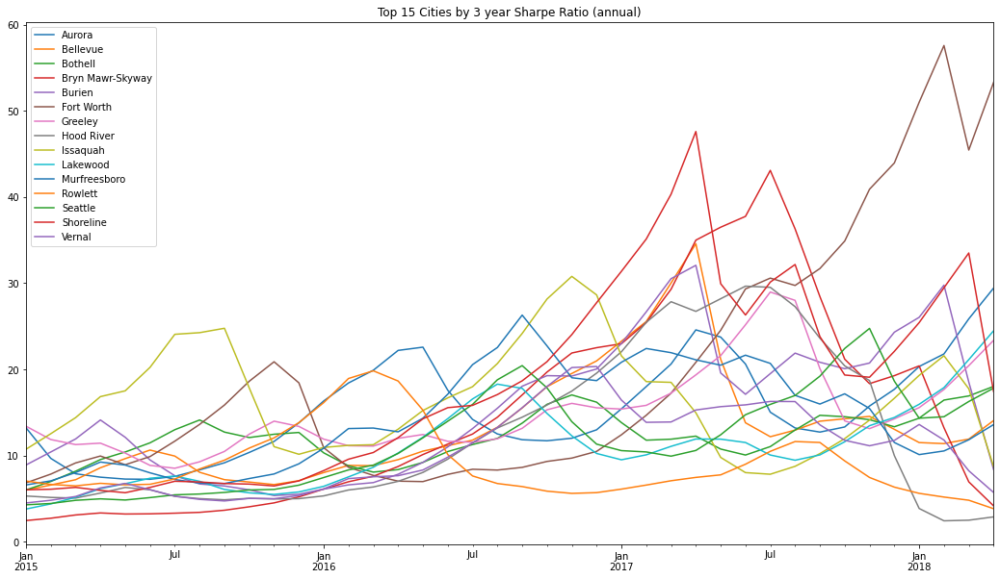

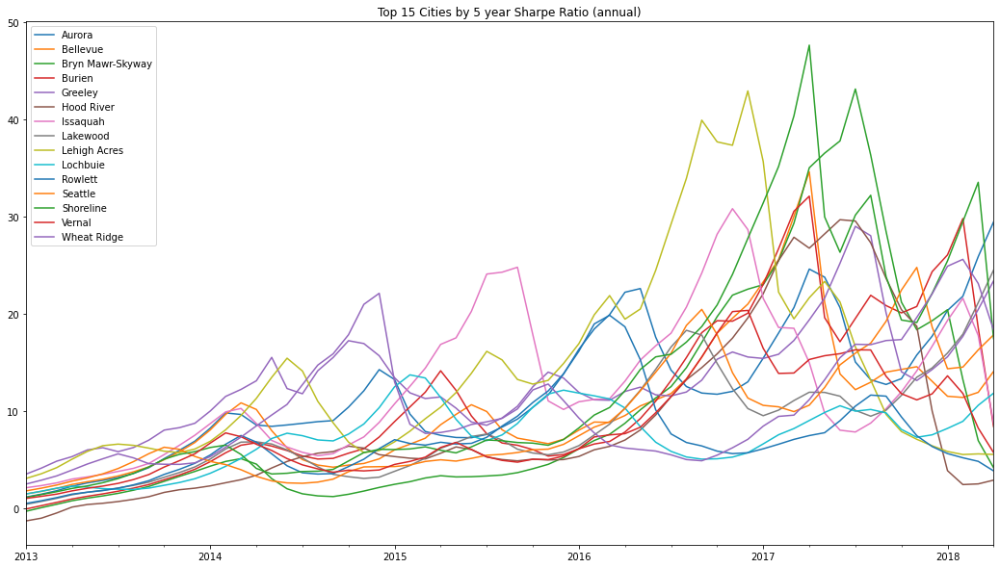

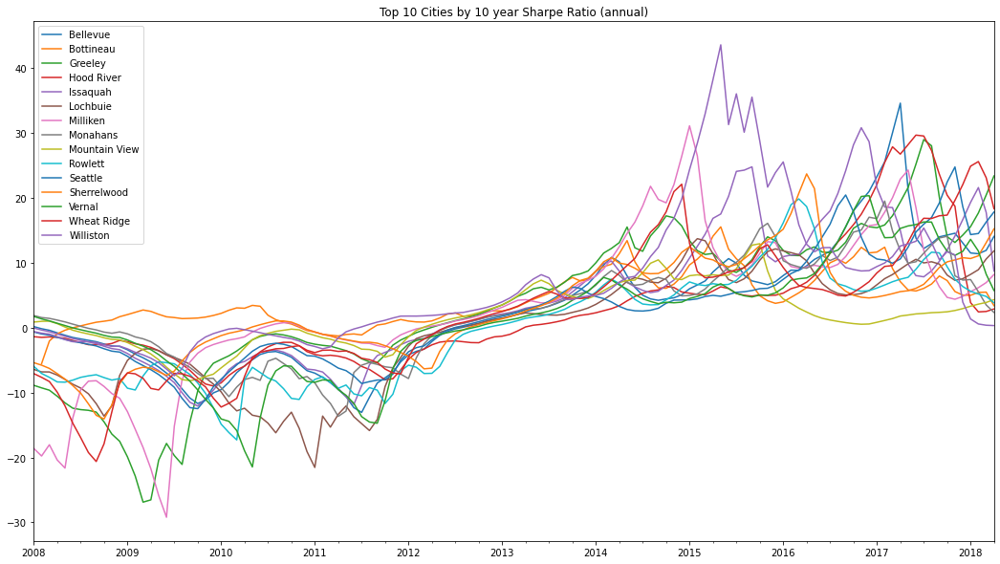

In [82]:
fig1, ax1 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty1:
        if x == city_df.columns[0]:
            city_df['2016-04-01':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax1,)
        else: continue
plt.legend()
plt.title('Top 15 Cities by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty3:
        if x == city_df.columns[0]:
            city_df['2015':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 15 Cities by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty5:
        if x == city_df.columns[0]:
            city_df['2013':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 15 Cities by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty10:
        if x == city_df.columns[0]:
            city_df['2008':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 Cities by 10 year Sharpe Ratio (annual)')

In [68]:
df[df.City == 'Fort Worth']

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
170,91325,76244,Fort Worth,TX,Dallas-Fort Worth,...,249700,250300,251000,251400,251300
335,91261,76116,Fort Worth,TX,Dallas-Fort Worth,...,181900,183300,185000,186600,187800
550,91291,76179,Fort Worth,TX,Dallas-Fort Worth,...,198100,199000,200000,201200,202100
562,91280,76137,Fort Worth,TX,Dallas-Fort Worth,...,195400,197000,198700,200500,201700
816,91276,76133,Fort Worth,TX,Dallas-Fort Worth,...,156600,158400,160600,163100,164900
1159,91257,76112,Fort Worth,TX,Dallas-Fort Worth,...,139600,141200,143300,145200,146400
1371,91253,76108,Fort Worth,TX,Dallas-Fort Worth,...,158300,160100,161900,163400,164300
1761,91252,76107,Fort Worth,TX,Dallas-Fort Worth,...,272400,275400,278800,282800,285500
1868,91264,76119,Fort Worth,TX,Dallas-Fort Worth,...,91000,92300,93400,94400,95100
2621,91275,76132,Fort Worth,TX,Dallas-Fort Worth,...,312400,314600,316200,316700,316500


In [67]:
df[df.City == 'Aurora']

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
129,93203,80013,Aurora,CO,Denver,...,329600,332600,335600,339000,341300
300,93205,80015,Aurora,CO,Denver,...,390300,393400,396100,399500,401800
662,93206,80016,Aurora,CO,Denver,...,531300,535700,540000,544500,547200
781,93202,80012,Aurora,CO,Denver,...,307400,311300,314800,318600,321100
887,93204,80014,Aurora,CO,Denver,...,336800,339900,342800,346300,348800
1089,84542,60506,Aurora,IL,Chicago,...,168500,168600,169200,170200,170500
1201,93201,80011,Aurora,CO,Denver,...,283700,286400,289300,293400,296400
1392,84541,60505,Aurora,IL,Chicago,...,125500,127600,129200,131100,132100
2246,84540,60504,Aurora,IL,Chicago,...,214800,216500,217100,216900,216500
2431,93207,80017,Aurora,CO,Denver,...,306500,309100,311800,315000,317300


First stop Aurora, Colorado as suspected from Arapahoe county auroroa certianly on the list of cities to invest in

we also like greeley as is treding up in the 5yr and and looks like it isinflecting upward in the 1 yr as well
although also in colorado so may consider elsewhere for diversification purposes



In [92]:
df[df.City == 'Tenino']

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
9122,99895,98589,Tenino,WA,Olympia,...,294400,297100,300100,303700,306000


In [131]:
look = ['Greeley','Aurora', 'Lakewood','Seattle','Bellevue','Sky Lake','Fort Worth','Everett','Tenino','Burien','Lehigh Acres']
look

['Greeley',
 'Aurora',
 'Lakewood',
 'Seattle',
 'Bellevue',
 'Sky Lake',
 'Fort Worth',
 'Everett',
 'Tenino',
 'Burien',
 'Lehigh Acres']

In [77]:
cty5

['Bellevue',
 'Greeley',
 'Seattle',
 'Burien',
 'Issaquah',
 'Aurora',
 'Vernal',
 'Bryn Mawr-Skyway',
 'Hood River',
 'Lakewood',
 'Lochbuie',
 'Shoreline',
 'Rowlett',
 'Wheat Ridge',
 'Lehigh Acres']

Text(0.5, 1.0, 'Top 10 Counties by 10 year Sharpe Ratio (annual)')

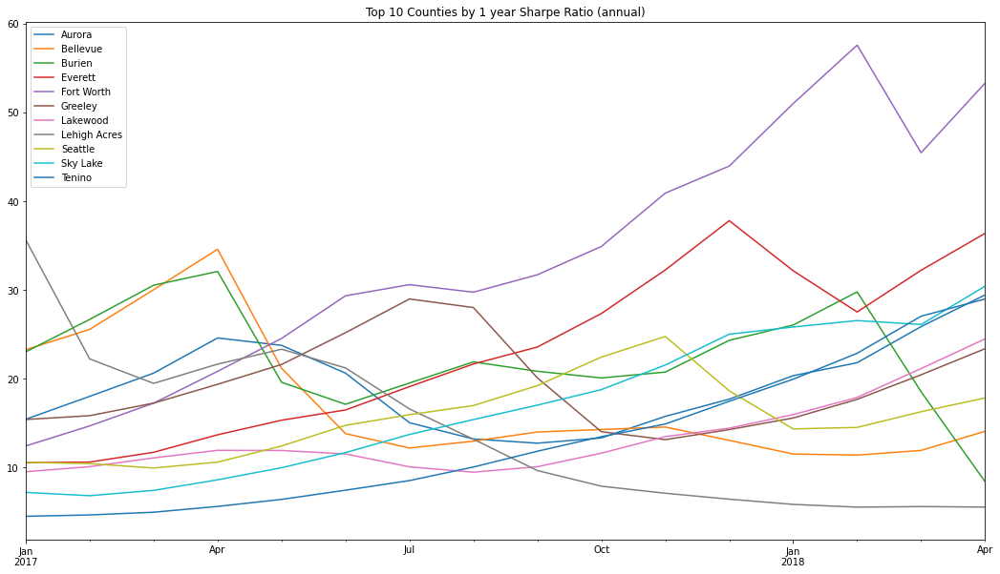

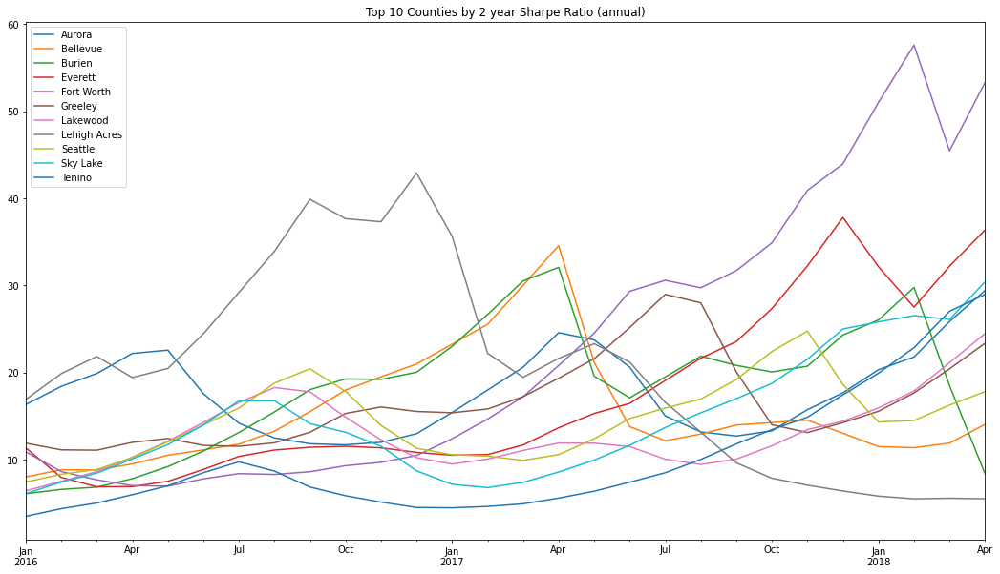

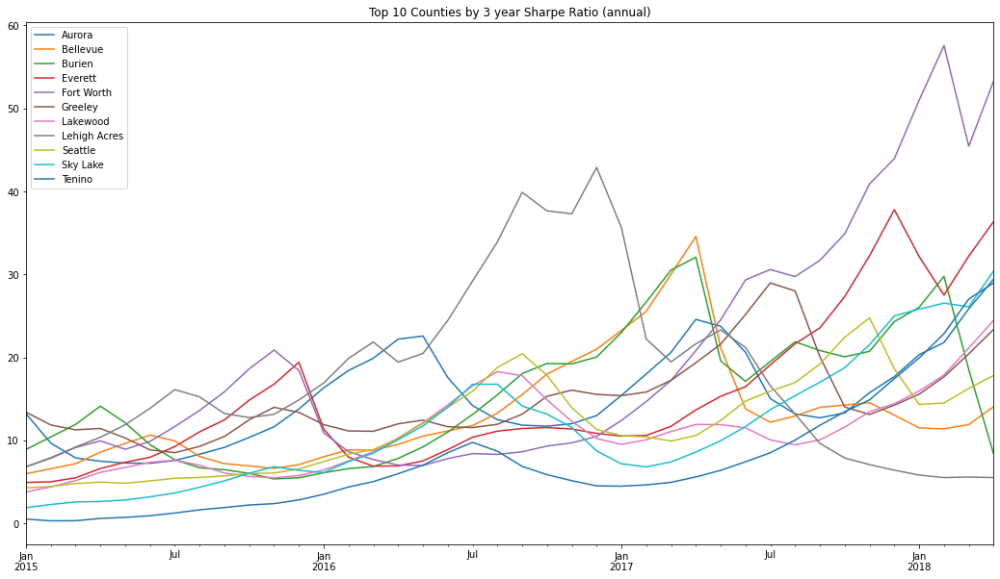

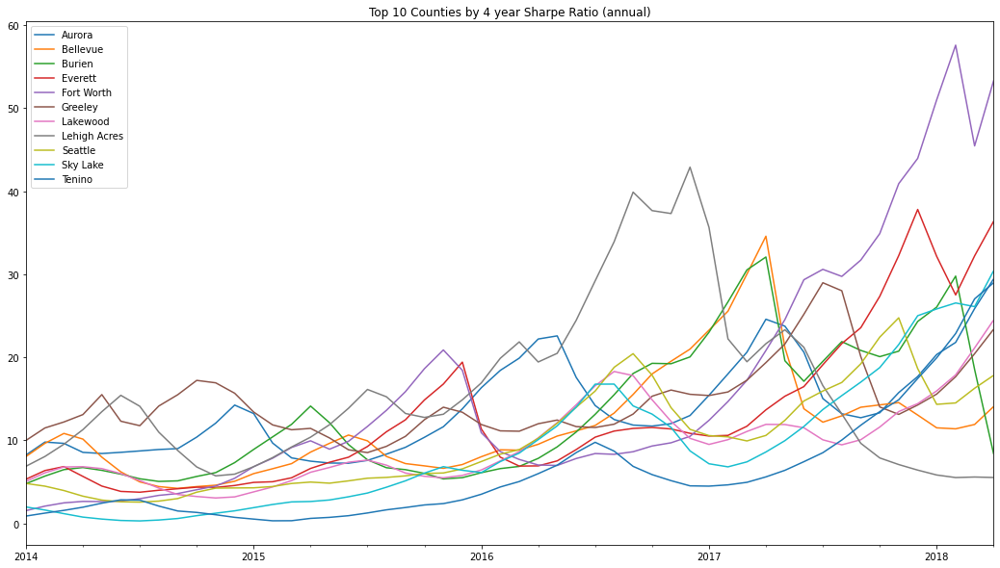

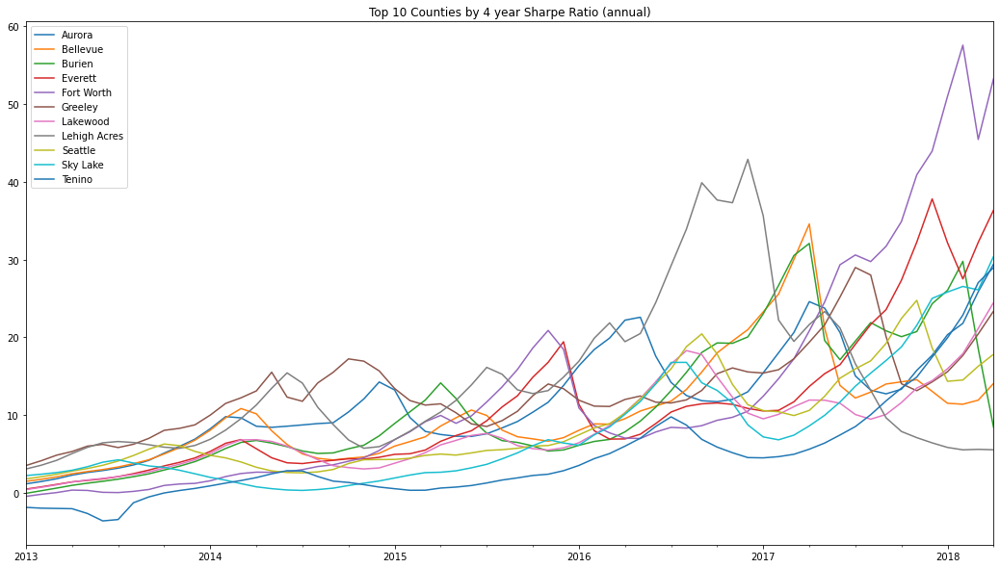

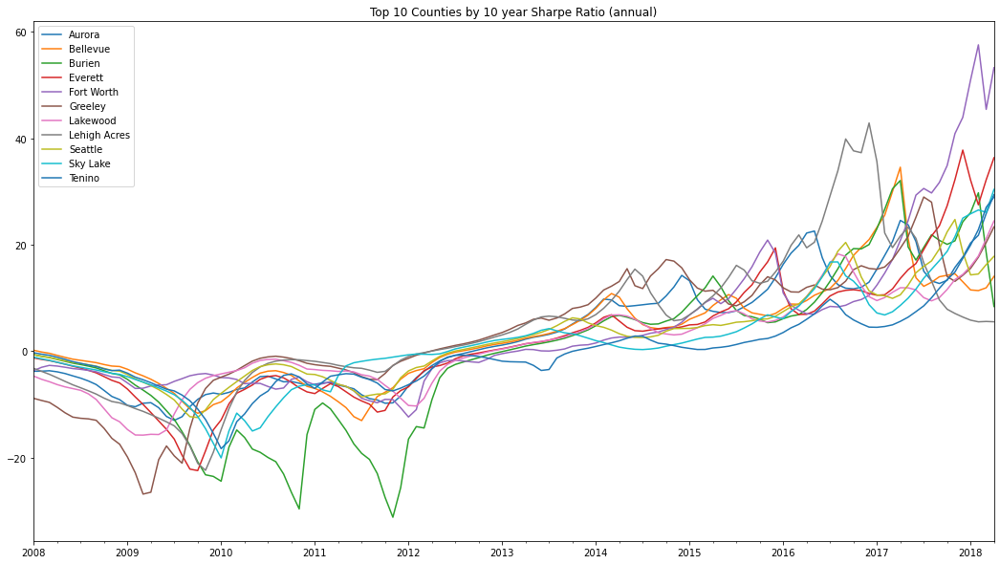

In [132]:
fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in look:
        if x == city_df.columns[0]:
            city_df['2017':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 1 year Sharpe Ratio (annual)')
fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in look:
        if x == city_df.columns[0]:
            city_df['2016':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 2 year Sharpe Ratio (annual)')
fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in look:
        if x == city_df.columns[0]:
            city_df['2015':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 3 year Sharpe Ratio (annual)')
fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in look:
        if x == city_df.columns[0]:
            city_df['2014':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 4 year Sharpe Ratio (annual)')
fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in look:
        if x == city_df.columns[0]:
            city_df['2013':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 4 year Sharpe Ratio (annual)')
fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in look:
        if x == city_df.columns[0]:
            city_df['2008':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 10 year Sharpe Ratio (annual)')

Looking at some of our top cities by different timelines, we notice that some of our cities that are currently outperforming in the 1-2 year range are not showing up in the 5 year + trends. As these cities where not providing high returns for longer periods of time these recent trends are not reflected in the longer averages and hence convinces me that I should be using the 1-3 year range of sharpe ratio to spot investment opportunities for 3-5 years

That being said of the top cities by sharpe ratio across the spectrum of years, top cities are Fort Worth, Aurora, Everett, Lakewood, and Sky Lake.

There are others among the list as well such as Greeley, Tenino and Seattle, but as those cities are not the best performing in the state/ county I want to diversify to elsewhere where possible.

In [268]:
FL =['Lehigh Acres','Sky Lake']

Text(0.5, 1.0, 'Austin by 3 year Sharpe Ratio (annual)')

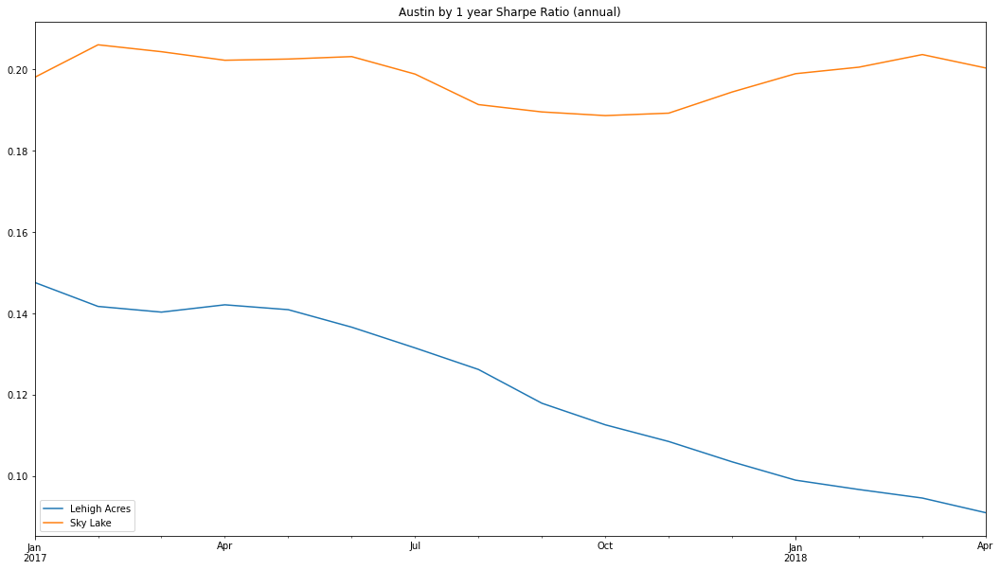

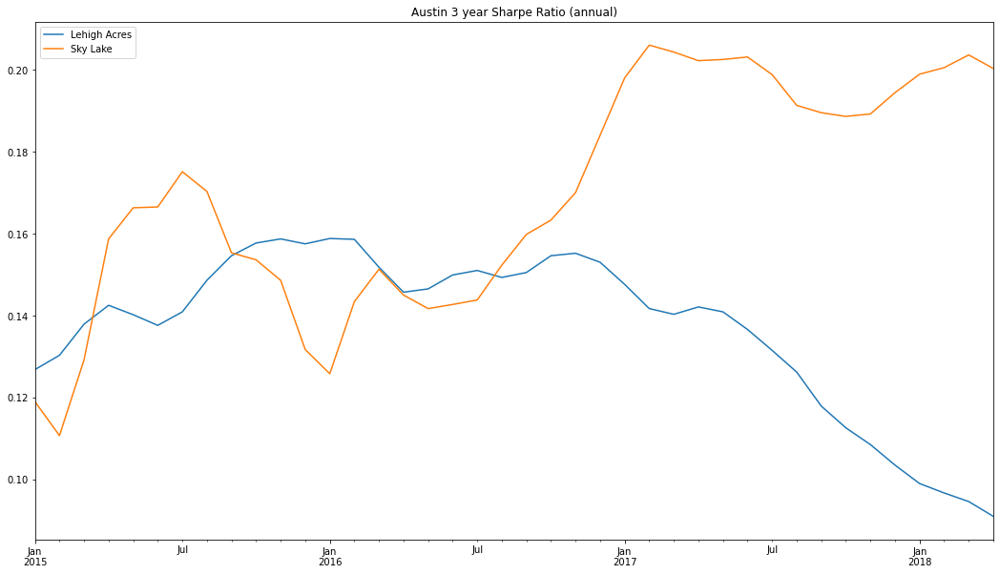

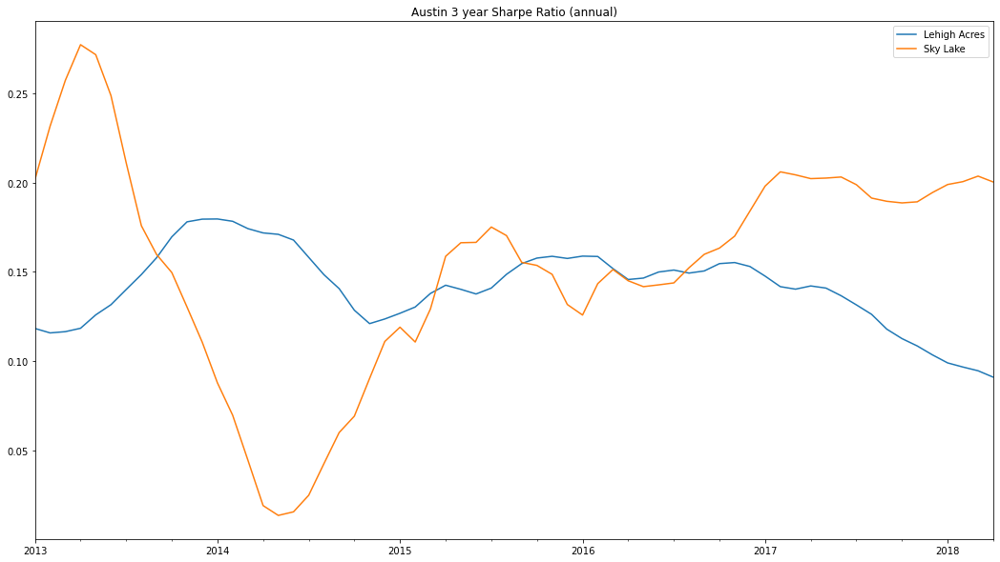

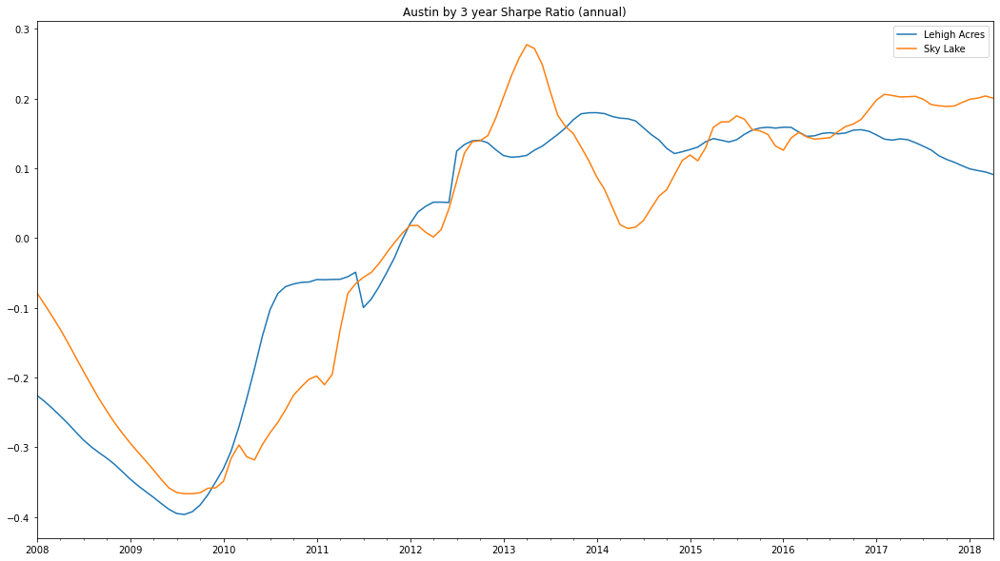

In [269]:
fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in FL:
        if x == city_df.columns[0]:
            city_df['2017':].ROI_YoY.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Austin by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in FL:
        if x == city_df.columns[0]:
            city_df['2015':].ROI_YoY.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Austin 3 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in FL:
        if x == city_df.columns[0]:
            city_df['2013':].ROI_YoY.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Austin 3 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in FL:
        if x == city_df.columns[0]:
            city_df['2008':].ROI_YoY.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Austin by 3 year Sharpe Ratio (annual)')

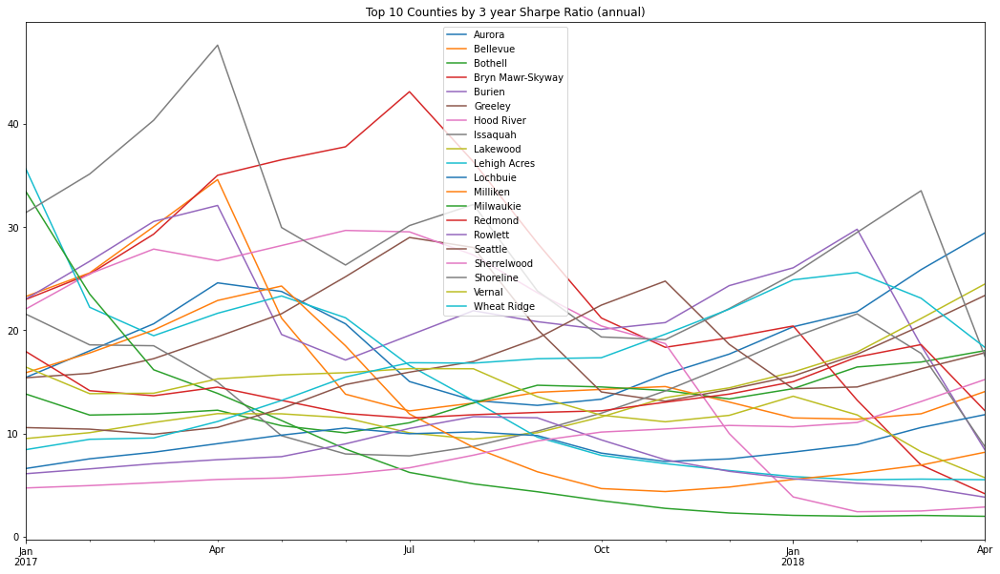

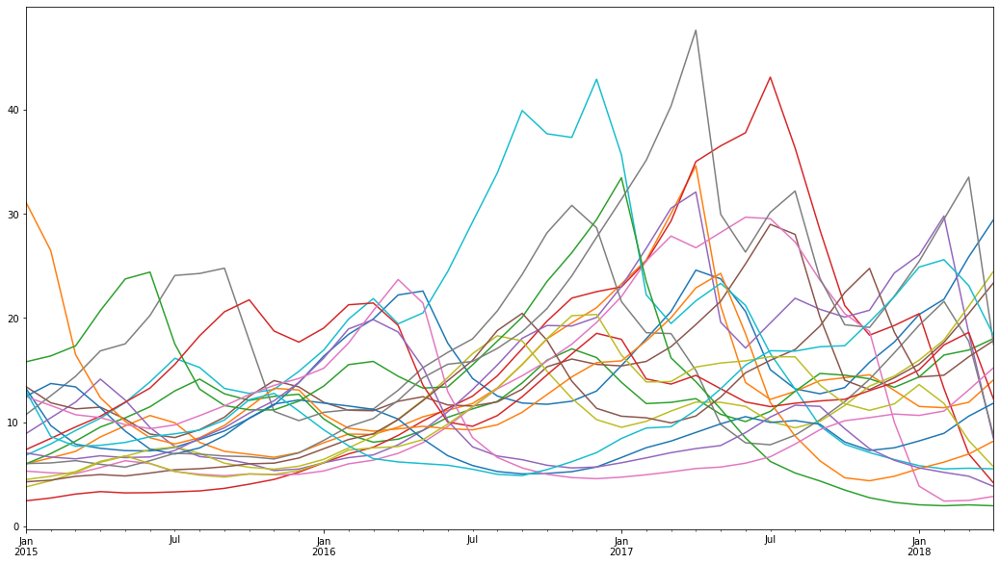

In [134]:
fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty5:
        if x == city_df.columns[0]:
            city_df['2017':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty5:
        if x == city_df.columns[0]:
            city_df['2015':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax2)
        else: continue

## Looking up Zipcodes

In [215]:
final_cities = ['Aurora','Greeley','Lakewood','Fort Worth','Everett','Seattle','Lehigh Acres','Sky Lake']

In [216]:
zips = df.loc[df['City'].isin(final_cities)].drop(columns=['RegionID','City', 'CountyName', 'Metro', 'State','SizeRank'],
                                           axis=1).groupby('RegionName').mean()

In [217]:
zips = df.loc[df['City'].isin(final_cities)].drop(columns=['RegionID','City', 'CountyName', 'Metro', 'State','SizeRank'],
                                           axis=1).groupby('RegionName').mean()
zips = pd.DataFrame(zips.reset_index())
zip_columns = list(zips.T.iloc[0])
zips = zips.T
zips.columns = zip_columns
zips = zips[1:]
zips = zips.set_index(pd.to_datetime(zips.index))
zips = zips.applymap(lambda x: round(np.float(x),2))

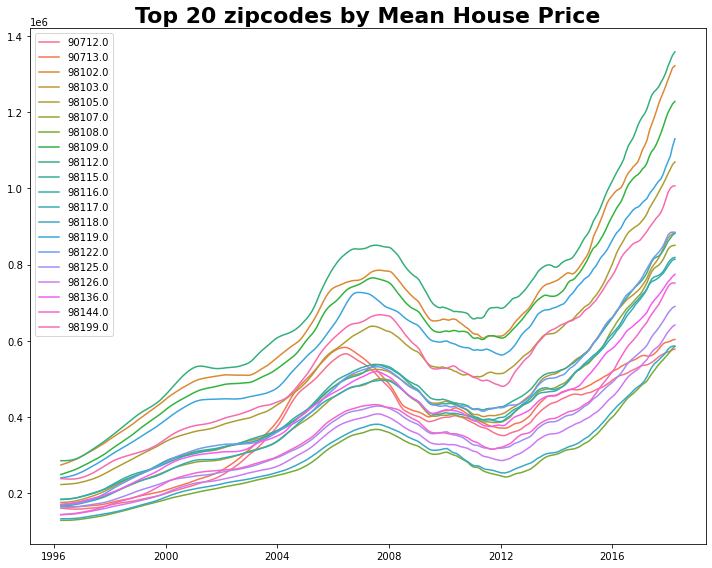

In [218]:
top20zips = list(zips.iloc[-1,:].sort_values(ascending=False).head(20).index)
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
rcParams['figure.figsize'] = 10,8
sns.lineplot(data=zips[top20zips],dashes=False)
plt.title('Top 20 zipcodes by Mean House Price',font=font)
plt.tight_layout()

Seattle clear winner by mean house price alone but as we know not full picture

In [219]:
zip_list = list(zips.columns)
len(zip_list)

90

In [220]:
zip_dfs = []
for x in zip_list:
    x = pd.DataFrame(data = zips[x])
    zip_dfs.append(x)

In [221]:
for zip_df in zip_dfs:
    zip_df['ROI_MoM'] = np.zeros((265))
    zip_df['ROI_YoY'] = np.zeros((265))
    for x in range(0,265):    
        if x + 1 <265:
            zip_df.iloc[x+1,1] = round((zip_df.iloc[x+1,0] - zip_df.iloc[x,0])/zip_df.iloc[x,0],4)
        else: break
    for x in range(0,265):    
        if x + 12 <265:
            zip_df.iloc[x+12,2] = round((zip_df.iloc[x+12,0] - zip_df.iloc[x,0])/zip_df.iloc[x,0],4)
        else: break
    zip_df['EMA_6MO_roi_mo'] = zip_df.ROI_MoM.ewm(span=6,adjust=False).mean()
    zip_df['EMA_6MO_std_mo'] = zip_df.ROI_MoM.ewm(span=6,adjust=False).std()
    zip_df['EMA_6MO_roi_y'] = zip_df.ROI_YoY.ewm(span=6,adjust=False).mean()
    zip_df['EMA_6MO_std_y'] = zip_df.ROI_YoY.ewm(span=6,adjust=False).std()
    zip_df['rfr'] = rfr.DGS10
    zip_df['sharpe_ratio_monthly'] = (zip_df['EMA_6MO_roi_mo'] - (zip_df.rfr/12))/zip_df['EMA_6MO_std_mo']
    zip_df['sharpe_ratio_annual'] = (zip_df['EMA_6MO_roi_y'] - (zip_df.rfr))/zip_df['EMA_6MO_std_y']

In [249]:

avg_5_mo = []
avg_5_y = []
avg_10_mo = []
avg_10_y= []
avg_1_mo =[]
avg_1_y=[]
avg_3_mo = []
avg_3_y = []
last_mo = []
for zip_ in zip_dfs:
    avg_1_mo.append(zip_['2017-04-01':].sharpe_ratio_monthly.mean())
    avg_1_y.append(zip_['2017-04-01':].sharpe_ratio_annual.mean())
    avg_5_mo.append(zip_['2013':'2018'].sharpe_ratio_monthly.mean())
    avg_5_y.append(zip_['2013':'2018'].sharpe_ratio_annual.mean())
    avg_10_mo.append(zip_['2008':'2018'].sharpe_ratio_monthly.mean())
    avg_10_y.append(zip_['2008':'2018'].sharpe_ratio_annual.mean())
    avg_3_mo.append(zip_['2015-04-01':].sharpe_ratio_monthly.mean())
    avg_3_y.append(zip_['2015-04-01':].sharpe_ratio_annual.mean())
    last_mo.append(zip_['2018-04'].sharpe_ratio_annual.mean())
zip_averages = pd.concat([pd.DataFrame(zip_list,dtype='str'),pd.DataFrame(avg_1_mo,dtype=float),pd.DataFrame(avg_1_y,dtype=float),
                            pd.DataFrame(avg_3_mo,dtype=float),pd.DataFrame(avg_3_y,dtype=float),
                            pd.DataFrame(avg_5_mo,dtype=float),pd.DataFrame(avg_5_y,dtype=float),
                            pd.DataFrame(avg_10_mo,dtype=float),pd.DataFrame(avg_10_y,dtype=float),
                            pd.DataFrame(last_mo)],axis=1)
zip_averages.columns = ['zipcode','1yr_average_mo','1yr_average_y',
                          '3yr_average_mo','3yr_average_y',
                          '5yr_average_mo','5yr_average_y',
                          '10yr_average_mo','10yr_average_y','last_month']

In [250]:
zip_averages

,zipcode,1yr_average_mo,1yr_average_y,3yr_average_mo,3yr_average_y,5yr_average_mo,5yr_average_y,10yr_average_mo,10yr_average_y,last_month
0,2149.0,3.700995,8.623342,3.098559,7.183642,2.697060,6.128196,0.329793,0.356365,10.870648
1,8701.0,0.745101,3.503331,1.349670,4.441678,1.082529,2.990195,-0.847570,-3.304846,1.704262
2,14750.0,-0.520544,-0.171744,0.160549,1.330562,-0.105006,0.208017,-0.270800,-1.187219,-2.132725
3,32809.0,6.247035,19.263661,3.991221,12.208059,2.755823,7.921848,0.197859,1.514534,30.409375
4,33936.0,2.470776,6.272188,3.760939,7.915590,3.221543,7.422976,0.393396,1.614159,5.550981
...,...,...,...,...,...,...,...,...,...,...
85,98199.0,2.731661,5.059120,3.032951,5.694451,2.637751,4.769104,0.498409,0.477724,5.767776
86,98201.0,3.472990,11.477121,2.436895,10.144777,1.929410,7.235758,-0.424969,-1.497428,12.823948
87,98203.0,4.137247,17.105417,4.079940,11.657600,3.041935,8.083110,0.031621,0.881828,19.969095
88,98498.0,3.796815,3.508144,2.225128,2.891597,1.539283,1.413037,-0.827109,-2.262203,5.942538


In [235]:
zip10 = (np.array(zip_averages.sort_values('10yr_average_mo',ascending=False).zipcode.head(30))).astype(np.float)
zip5 = (np.array(zip_averages.sort_values('5yr_average_mo',ascending=False).zipcode.head(30))).astype(np.float)
zip3 =(np.array(zip_averages.sort_values('3yr_average_mo',ascending=False).zipcode.head(30))).astype(np.float)
zip1 =(np.array(zip_averages.sort_values('1yr_average_mo',ascending=False).zipcode.head(30))).astype(np.float)


In [162]:
zip10 = (np.array(zip_averages.sort_values('10yr_average_mo',ascending=False).zipcode.head(20))).astype(np.float)
zip10

array([80010., 80017., 98115., 80013., 33971., 80015., 80011., 80215.,
       80214., 98029., 80012., 80634., 98027., 80014., 98117., 98144.,
       98106., 80018., 98105., 80631.])

In [227]:
check = [80215,80631,98498,76131,98108,32809,98105,80215,76179,98203]

In [253]:
len(zip_averages[zip_averages.last_month>10])

35

In [252]:
zip_averages[zip_averages.last_month>10]

,zipcode,1yr_average_mo,1yr_average_y,3yr_average_mo,3yr_average_y,5yr_average_mo,5yr_average_y,10yr_average_mo,10yr_average_y,last_month
0,2149.0,3.700995,8.623342,3.098559,7.183642,2.697060,6.128196,0.329793,0.356365,10.870648
3,32809.0,6.247035,19.263661,3.991221,12.208059,2.755823,7.921848,0.197859,1.514534,30.409375
26,76111.0,2.499688,7.582918,1.870223,4.535900,1.344891,3.158355,-0.001567,-0.516876,11.650796
28,76114.0,3.954527,7.164324,2.203134,5.257282,1.513735,3.935947,0.036823,0.380123,10.378739
33,76131.0,3.745168,12.270395,3.814182,10.300408,2.554770,5.868119,-0.047994,-1.063751,12.612001
34,76132.0,1.563896,6.340146,1.185956,3.567744,0.963292,2.805767,-0.169740,-0.295336,10.222613
37,76135.0,2.900538,7.893688,2.436606,8.861466,2.014887,6.911728,-0.075994,1.244794,10.273898
42,76179.0,3.750166,10.529083,3.596064,8.379717,2.733012,5.749869,-0.027287,-1.599316,10.368459
44,76247.0,1.727574,7.352489,1.551257,5.066621,1.143826,3.026936,-0.104076,0.116390,10.132323
46,80011.0,4.022788,6.342294,5.380177,12.000905,4.635941,9.730567,1.189475,2.841164,10.216133


In [ ]:
trend = []

Text(0.5, 1.0, 'Top 20 Zipcodes by 10 year Sharpe Ratio (annual)')

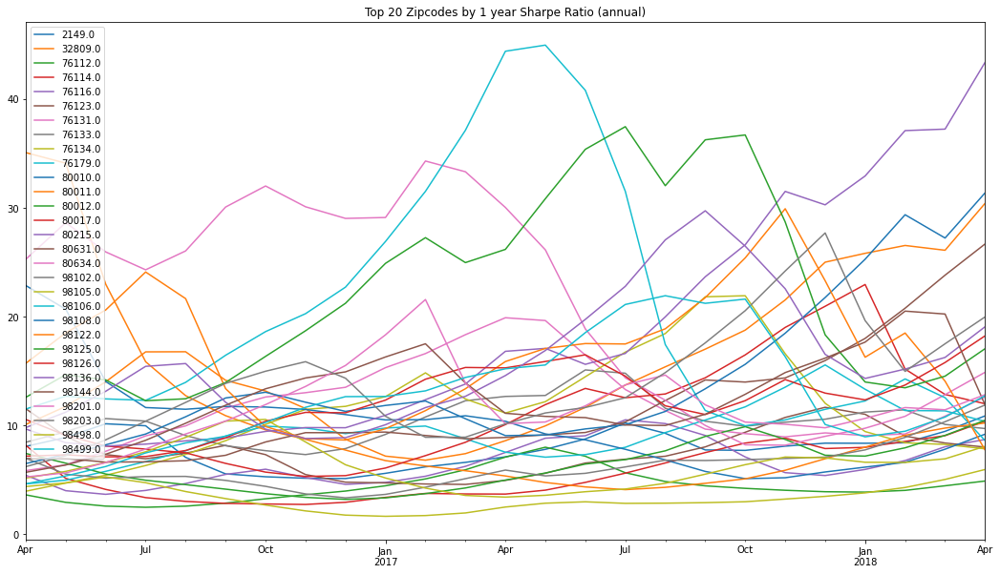

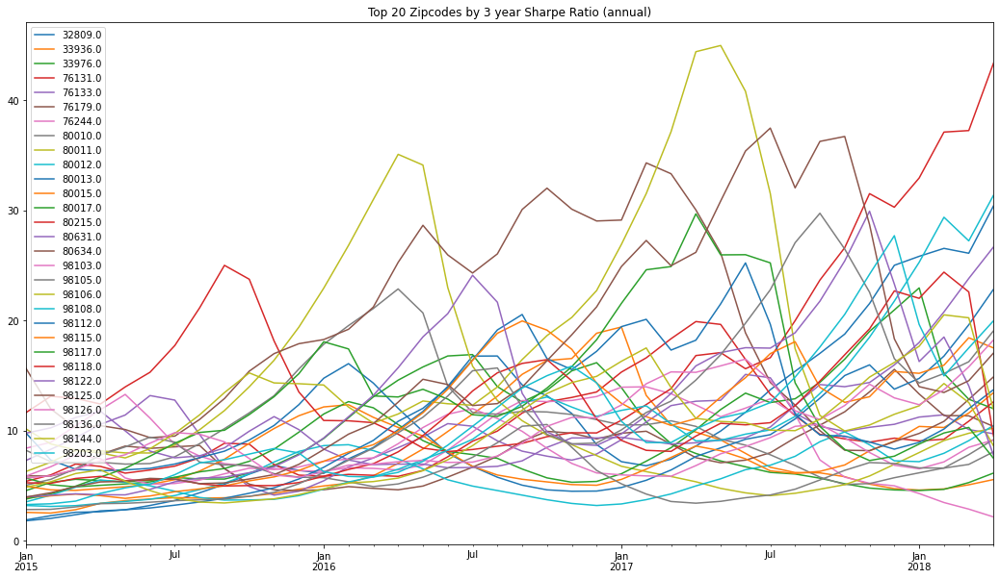

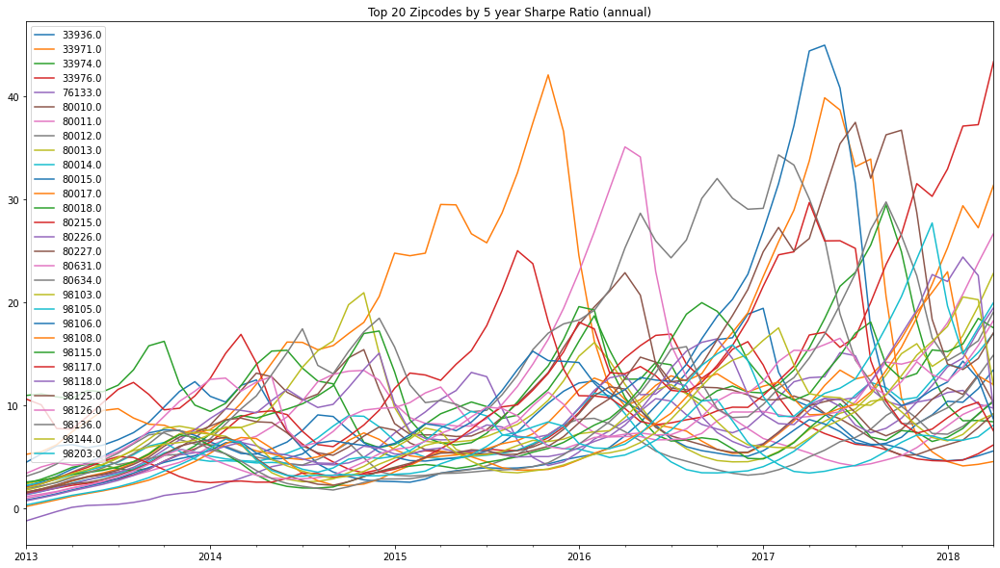

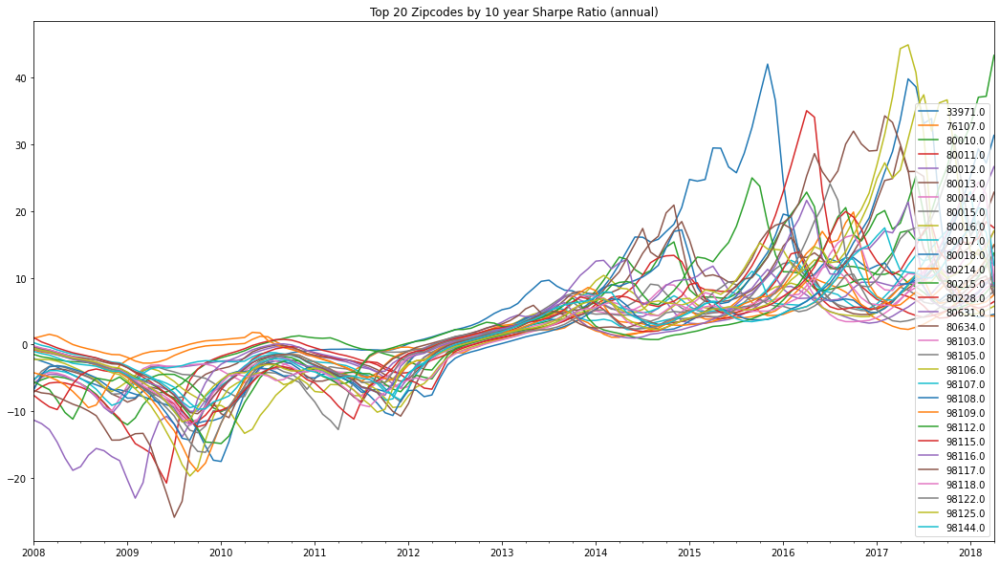

In [254]:
fig1, ax1 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in zip1:
        if x == zip_df.columns[0]:
            zip_df['2016-04-01':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax1,)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in zip3:
        if x == zip_df.columns[0]:
            zip_df['2015':].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in zip5:
        if x == zip_df.columns[0]:
            zip_df['2013':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in zip10:
        if x == zip_df.columns[0]:
            zip_df['2008':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 10 year Sharpe Ratio (annual)')

In [274]:
df[df.City == 'San Diego']

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
164,96667,92126,San Diego,CA,San Diego,...,603300,608400,612300,614600,615100
208,96651,92109,San Diego,CA,San Diego,...,1175300,1186600,1200400,1217700,1231200
211,96643,92101,San Diego,CA,San Diego,...,624900,625200,631800,644200,652600
412,96646,92104,San Diego,CA,San Diego,...,733100,738100,744600,752900,758200
413,96657,92115,San Diego,CA,San Diego,...,559700,564700,569000,572600,573900
427,96690,92154,San Diego,CA,San Diego,...,466500,470600,473400,475900,477600
471,96647,92105,San Diego,CA,San Diego,...,424500,428000,430400,431400,431600
482,96664,92122,San Diego,CA,San Diego,...,869100,878200,884900,888800,889500
565,96659,92117,San Diego,CA,San Diego,...,658700,663900,668100,671500,673100
569,96671,92130,San Diego,CA,San Diego,...,1252600,1262800,1271900,1280500,1284800


In [272]:
df[df.RegionName == 80634]

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
249,93490,80634,Greeley,CO,Greeley,...,291800,294200,296700,299400,301100


In [190]:
df[df.RegionName == 80215]

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
4967,93291,80215,Lakewood,CO,Denver,...,463700,467300,471400,476200,479000


In [191]:
df[df.RegionName == 80631]

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
1235,93487,80631,Greeley,CO,Greeley,...,217700,220400,223600,226900,228600


In [214]:
df[df.RegionName == 98148]

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
8029,99598,98148,Burien,WA,Seattle,...,408100,413100,416500,420500,424500


In [283]:
topzips = [32809,98203,98108,80215,80631,76131,2149]

In [278]:
df.loc[df['RegionName'].isin(topzips)]

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
1235,93487,80631,Greeley,CO,Greeley,...,217700,220400,223600,226900,228600
2422,99626,98203,Everett,WA,Seattle,...,380100,384300,388900,395700,401300
2689,91274,76131,Fort Worth,TX,Dallas-Fort Worth,...,195800,197100,198700,200600,201900
4734,72235,32809,Sky Lake,FL,Orlando,...,171400,174800,177800,180900,183400
4967,93291,80215,Lakewood,CO,Denver,...,463700,467300,471400,476200,479000
5436,99568,98108,Seattle,WA,Seattle,...,557400,564800,572000,580000,584900


In [239]:
z10 = list(zip_averages.sort_values('10yr_average_mo',ascending=False).zipcode.head(30))
z5 = list(zip_averages.sort_values('5yr_average_mo',ascending=False).zipcode.head(30))
z3 =list(zip_averages.sort_values('3yr_average_mo',ascending=False).zipcode.head(30))
z1 =list(zip_averages.sort_values('1yr_average_mo',ascending=False).zipcode.head(30))
all_zips = set(z10 + z5 +z3 +z1)
len(all_zips)


53

In [ ]:
all_zips

In [203]:
len(topzips5yr)

37

In [206]:
topzips5yr = zip_averages.loc[zip_averages['zipcode'].isin(all_zips)].sort_values('5yr_average_y',ascending=False)
topzips5yr.head(20)

,zipcode,1yr_average_mo,1yr_average_y,3yr_average_mo,3yr_average_y,5yr_average_mo,5yr_average_y,10yr_average_mo,10yr_average_y
5,33971.0,2.411950,18.491725,3.284897,21.096382,4.202662,17.461200,1.280953,7.135194
62,80634.0,4.693345,14.257879,4.872852,19.071618,4.188591,14.975005,0.993982,4.275727
67,98027.0,2.326752,10.925582,4.517179,19.176210,3.604399,13.870067,0.928584,5.288017
56,80215.0,4.502473,26.825615,4.331871,17.839902,3.672739,12.970746,1.178216,4.357150
85,98133.0,4.705123,32.629807,4.601911,19.902893,3.358556,12.770734,0.581042,4.319529
72,98106.0,4.506022,20.772638,5.034596,17.450327,3.901986,12.047575,0.833894,3.439898
83,98125.0,4.235666,26.219167,4.422857,17.128275,3.305350,11.513857,0.778016,3.917760
89,98148.0,2.241373,10.317818,4.540935,14.002107,3.601298,10.346462,0.608741,-0.087967
94,98178.0,3.367006,24.658597,6.127059,15.971921,4.054054,10.167322,0.631708,1.452014
61,80631.0,5.403791,15.205194,4.015980,10.824826,3.266233,9.744825,0.793515,1.986846


In [259]:
austin = [78744]

In [280]:
df[df.RegionName == 76131]

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
2689,91274,76131,Fort Worth,TX,Dallas-Fort Worth,...,195800,197100,198700,200600,201900


In [211]:
check1 = np.array([80215,80011,80013,98148,80631,80634,80018,],dtype=float)

In [208]:
check = np.array(topzips5yr.zipcode.head(20)).astype(np.float)
type(check)

numpy.ndarray

As noted earlier, Bryn Mawr has come off and shouldn't be included.

80215 Easily top performing Zipcode Lakewood CO
80631 2nd top performing zipcode and Greeley CO
80013 3rd top and Aurora CO

Text(0.5, 1.0, 'Top 20 Zipcodes by 10 year Sharpe Ratio (annual)')

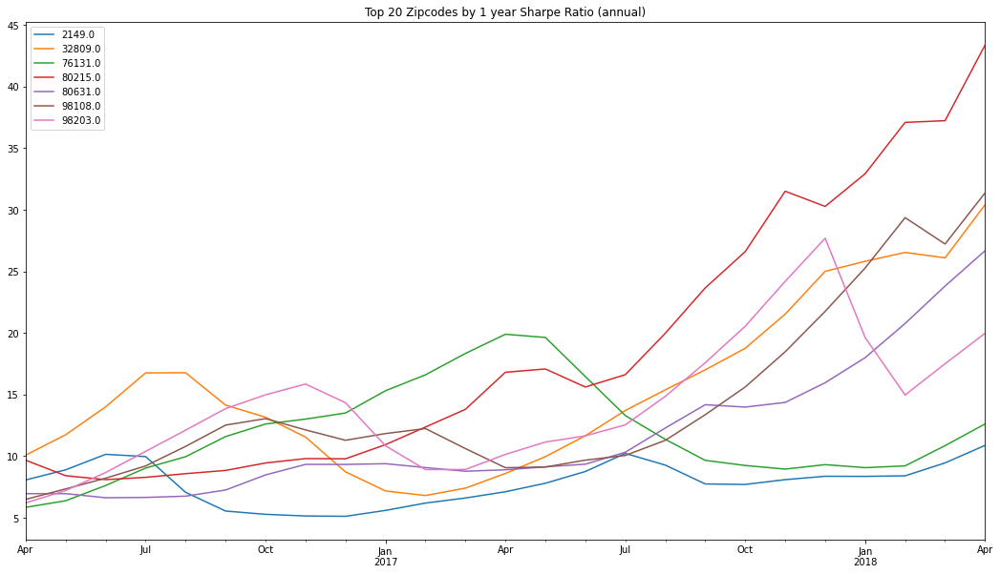

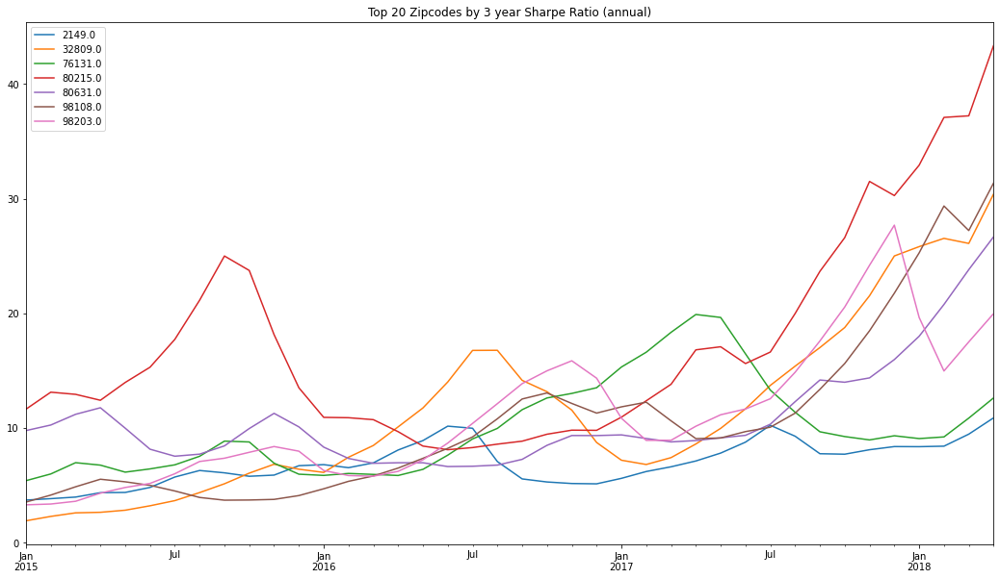

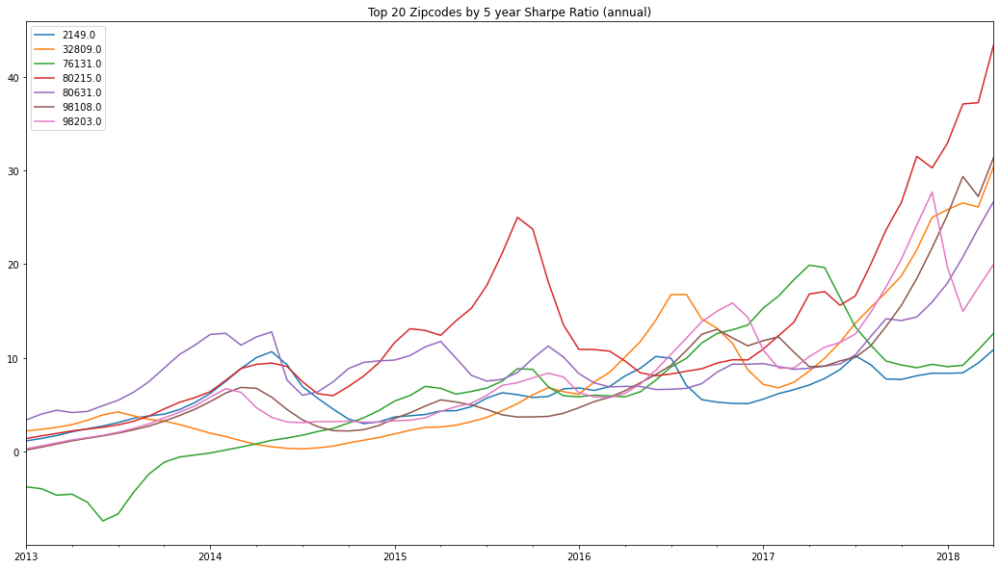

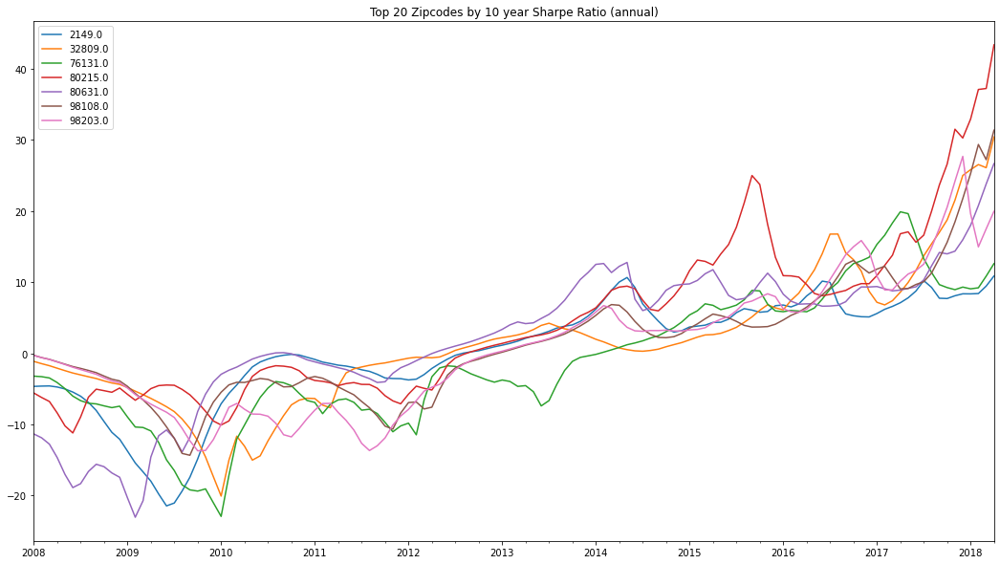

In [284]:
fig1, ax1 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in topzips:
        if x == zip_df.columns[0]:
            zip_df['2016-04-01':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax1,)
        else: continue
plt.legend(loc=2)
plt.title('Top 20 Zipcodes by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in topzips:
        if x == zip_df.columns[0]:
            zip_df['2015':].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in topzips:
        if x == zip_df.columns[0]:
            zip_df['2013':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in topzips:
        if x == zip_df.columns[0]:
            zip_df['2008':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 10 year Sharpe Ratio (annual)')

Text(0.5, 1.0, 'Top 20 Zipcodes by 10 year Sharpe Ratio (annual)')

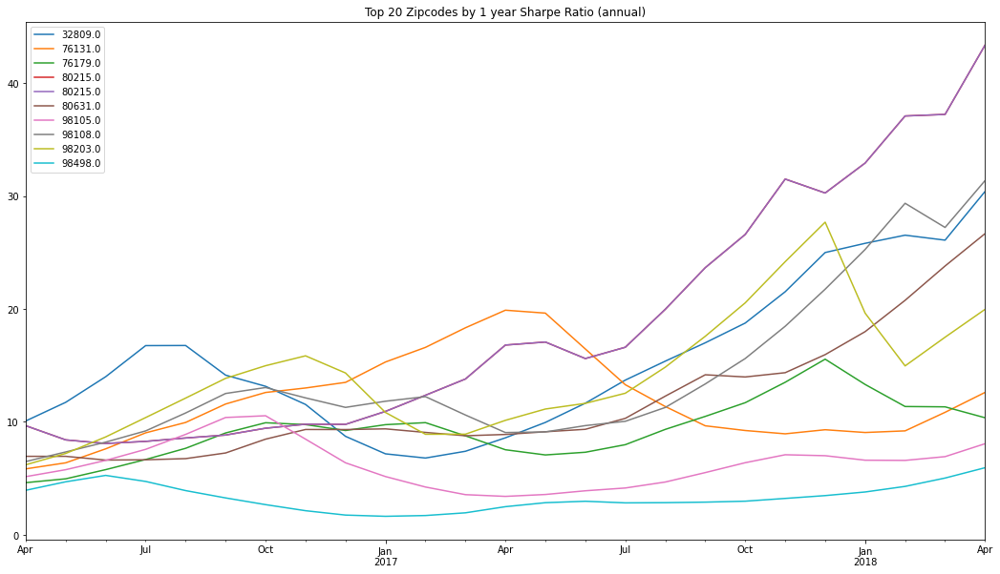

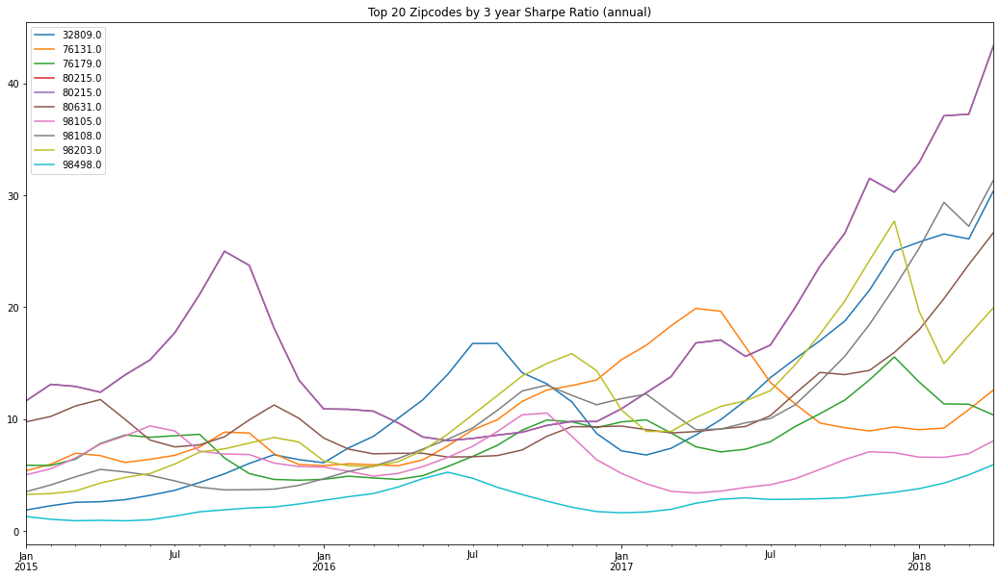

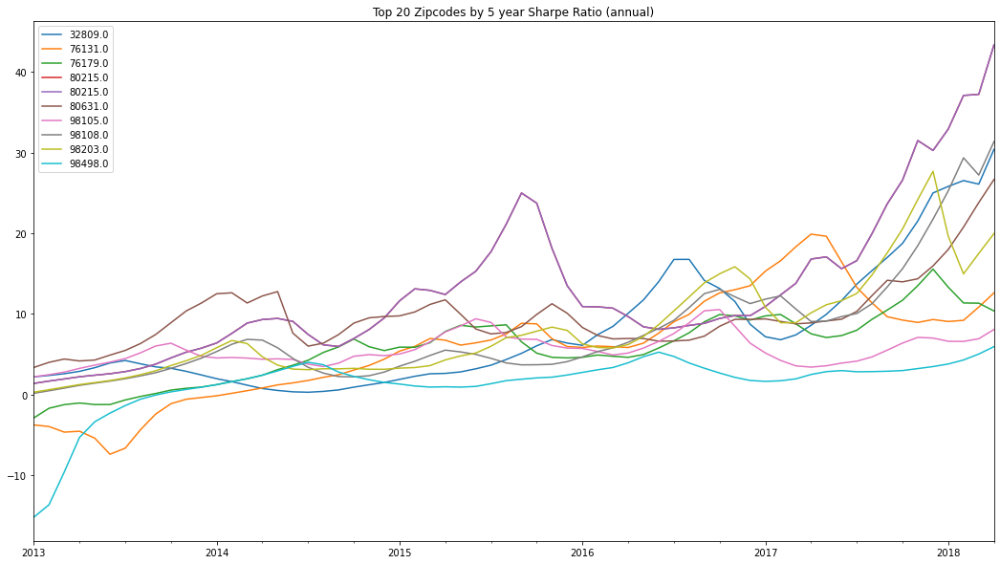

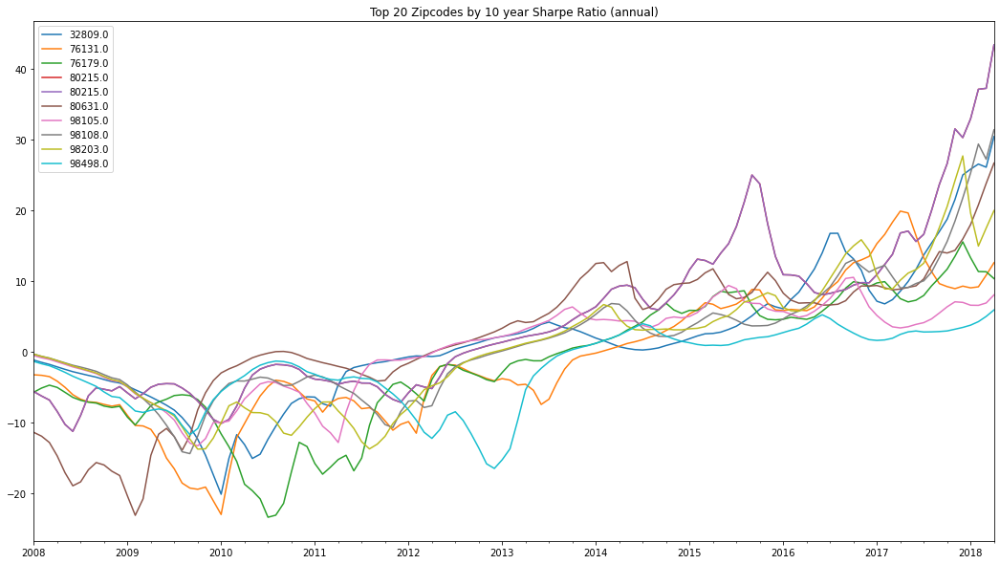

Text(0.5, 1.0, 'Top 20 Zipcodes by 10 year Sharpe Ratio (annual)')

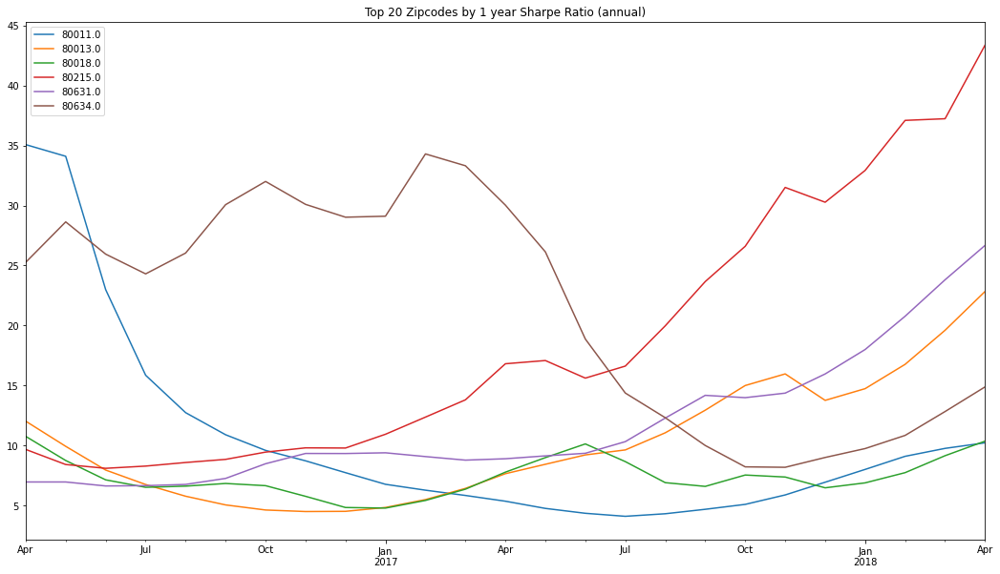

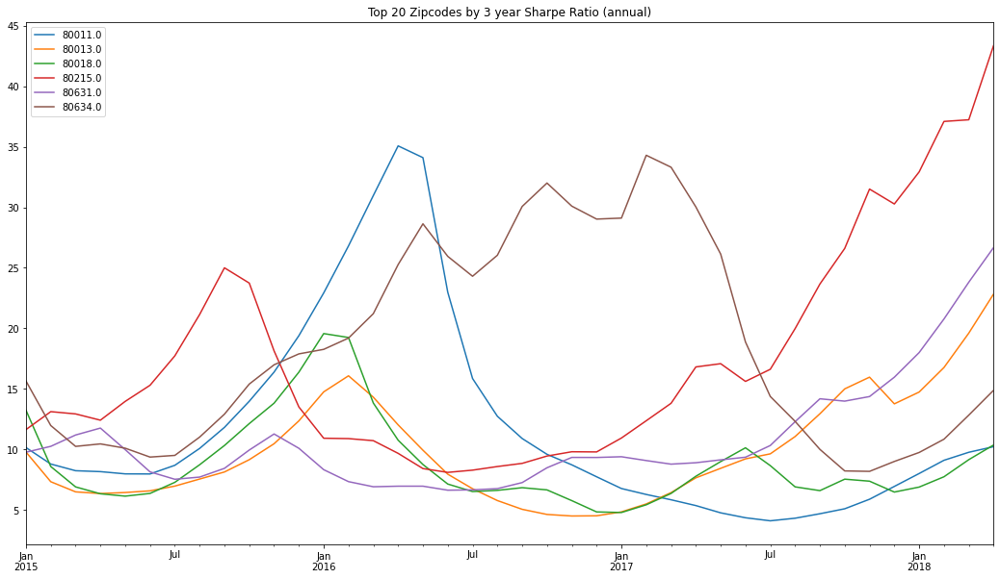

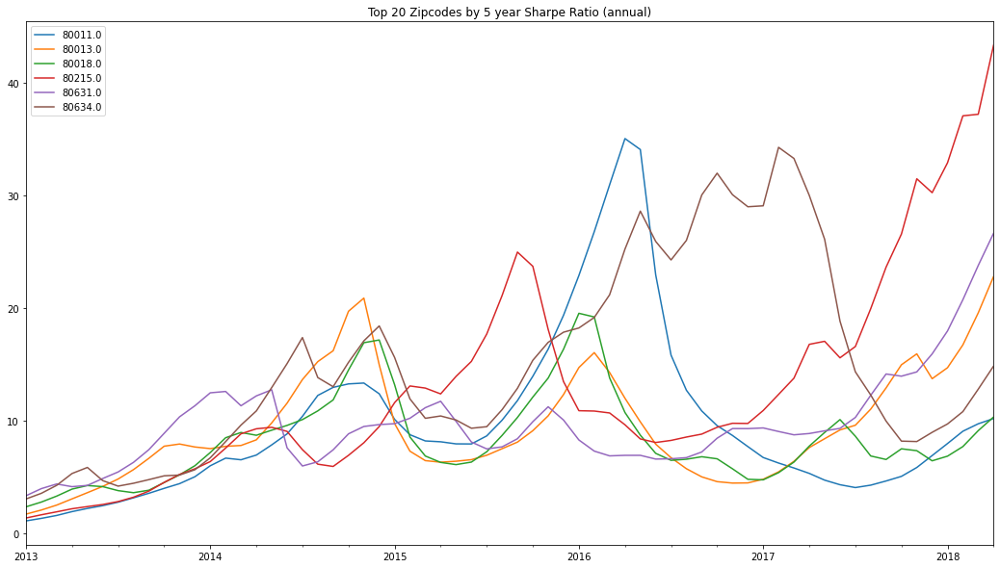

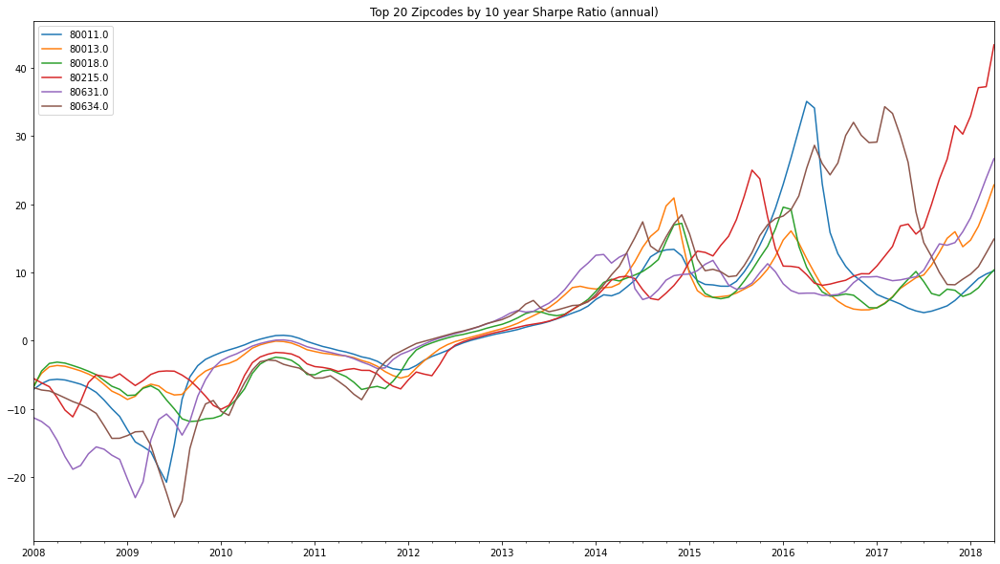

In [228]:
fig1, ax1 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in check1:
        if x == zip_df.columns[0]:
            zip_df['2016-04-01':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax1,)
        else: continue
plt.legend(loc=2)
plt.title('Top 20 Zipcodes by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in check1:
        if x == zip_df.columns[0]:
            zip_df['2015':].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in check1:
        if x == zip_df.columns[0]:
            zip_df['2013':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(18,10))
for zip_df in zip_dfs:
    for x in check1:
        if x == zip_df.columns[0]:
            zip_df['2008':'2018'].sharpe_ratio_annual.plot(label=zip_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 20 Zipcodes by 10 year Sharpe Ratio (annual)')